## Часть 1.
### Исследовательский анализ данных(EDA) и первичный отбор признаков.


**Оглавление**
* Разделы:
    * [0. Загрузка и просмотр данных](#load)
    * [1. АНАЛИЗ train и client_profile](#train_cp) 
    * [2. АНАЛИЗ train и payments](#train_payments)
    * [3. АНАЛИЗ train и bki](#train_bki)
    * [4. АНАЛИЗ train и applications_history](#train_app_hist)
    * [5. АНАЛИЗ предсказания 4-х моделей (4 разных набора данных)](#predict)
    * [6. Сборка датасета из отобранных признаков](#predict_selections)
    * [7. Вывод](#end)
 


#### Загрузка данных и просмотр <a class='anchor' id='load'>

В соревновании представлены 4 типы источника данных, которые могут быть интерпретированы как таблицы в базе данных.

Некоторые источники данных уже готовы для моделирования, представлены в агрерированном виде. Другие источники данных требуется представить в удобном для модели виде.

Для построения модели в данном соревновании сначала нужно будет собрать выборку для обучения модели.

Описание источников данных:

train.csv - пары "заявка - целевая переменная", для этой выборки нужно собрать признаки и обучить модель;
test.csv - пары "заявки - прогнозное значение", для этой выборки нужно собрать признаки и построить прогнозы;
bki.csv - данные БКИ о предыдущих кредитах клиента;
client_profile.csv - клиентский профиль, некоторые знания, которые есть у компании о клиенте;
payments.csv - история платежей клиента;
applications_history.csv - история предыдущих заявок клиента.

In [1]:
from typing import List, Optional
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns
import scipy.stats as st
from scipy.stats import probplot, ks_2samp

from sklearn.model_selection import KFold, cross_val_score
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_is_fitted
import missingno as msno


# plt.style.use('fivethirtyeight')
# %config InlineBackend.figure_format = 'svg'
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import (roc_auc_score, roc_curve, auc, confusion_matrix, accuracy_score, \
                            classification_report, plot_confusion_matrix, plot_precision_recall_curve, \
                            precision_recall_curve, recall_score, plot_roc_curve)

import xgboost as xgb
import catboost as cb
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from sklearn.model_selection import train_test_split

In [2]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    for col in df.columns:
        col_type = df[col].dtype
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')
    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(
        100 * (start_mem - end_mem) / start_mem))

    return df

In [3]:
train = reduce_mem_usage(pd.read_csv(r"./competitive-data-analysis_coursework/train.csv"))
test = reduce_mem_usage(pd.read_csv(r"./competitive-data-analysis_coursework/test.csv"))
client_profile = reduce_mem_usage(pd.read_csv(r"./competitive-data-analysis_coursework/client_profile.csv"))
payments = reduce_mem_usage(pd.read_csv(r"./competitive-data-analysis_coursework/payments.csv"))
bki = reduce_mem_usage(pd.read_csv(r"./competitive-data-analysis_coursework/bki.csv"))
applications_history = reduce_mem_usage(pd.read_csv(r"./competitive-data-analysis_coursework/applications_history.csv"))

Memory usage of dataframe is 2.52 MB
Memory usage after optimization is: 0.63 MB
Decreased by 75.0%
Memory usage of dataframe is 2.52 MB
Memory usage after optimization is: 0.79 MB
Decreased by 68.7%
Memory usage of dataframe is 45.78 MB
Memory usage after optimization is: 18.12 MB
Decreased by 60.4%
Memory usage of dataframe is 62.50 MB
Memory usage after optimization is: 29.30 MB
Decreased by 53.1%
Memory usage of dataframe is 122.60 MB
Memory usage after optimization is: 48.68 MB
Decreased by 60.3%
Memory usage of dataframe is 331.31 MB
Memory usage after optimization is: 114.69 MB
Decreased by 65.4%


In [4]:
train.head(2)

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE
0,123687442,0,Cash
1,123597908,1,Cash
2,123526683,0,Cash
3,123710391,1,Cash
4,123590329,1,Cash
...,...,...,...
110088,123458312,0,Cash
110089,123672463,0,Cash
110090,123723001,0,Cash
110091,123554358,0,Cash


In [ ]:
test.head(2)

In [ ]:
client_profile.head(2)

In [ ]:
payments.head(2)

In [ ]:
bki.head(2)

In [ ]:
applications_history.head(2)

### 1. АНАЛИЗ train и client_profile <a class='anchor' id='train_cp'>

In [5]:
client_profile.head()

,APPLICATION_NUMBER,GENDER,CHILDRENS,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,FAMILY_STATUS,REGION_POPULATION,AGE,...,FAMILY_SIZE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,123666076,F,0,157500.0,270000.0,13500.0,Incomplete higher,Civil marriage,0.008068,8560,...,2.0,0.329471,0.236315,0.678568,0.0,0.0,0.0,0.0,1.0,2.0
1,123423688,F,0,270000.0,536917.5,28467.0,Secondary / secondary special,Married,0.020246,23187,...,2.0,NaN,0.442295,0.802745,0.0,0.0,0.0,0.0,1.0,1.0
2,123501780,M,1,427500.0,239850.0,23850.0,Incomplete higher,Married,0.072508,14387,...,3.0,0.409017,0.738159,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,123588799,M,0,112500.0,254700.0,17149.5,Secondary / secondary special,Married,0.019101,14273,...,2.0,NaN,0.308994,0.590233,0.0,0.0,0.0,0.0,0.0,3.0
4,123647485,M,0,130500.0,614574.0,19822.5,Lower secondary,Married,0.022625,22954,...,2.0,NaN,0.739408,0.156640,0.0,0.0,1.0,0.0,0.0,6.0


In [6]:
client_profile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   APPLICATION_NUMBER          250000 non-null  int32   
 1   GENDER                      250000 non-null  category
 2   CHILDRENS                   250000 non-null  int8    
 3   TOTAL_SALARY                250000 non-null  float32 
 4   AMOUNT_CREDIT               250000 non-null  float32 
 5   AMOUNT_ANNUITY              249989 non-null  float32 
 6   EDUCATION_LEVEL             250000 non-null  category
 7   FAMILY_STATUS               250000 non-null  category
 8   REGION_POPULATION           250000 non-null  float32 
 9   AGE                         250000 non-null  int16   
 10  DAYS_ON_LAST_JOB            250000 non-null  int32   
 11  OWN_CAR_AGE                 85041 non-null   float32 
 12  FLAG_PHONE                  250000 non-null  int8    
 13 

In [68]:
# Количество дубликатов
client_profile.duplicated().sum()

0

In [11]:
client_profile.describe()

,APPLICATION_NUMBER,CHILDRENS,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,FLAG_PHONE,...,FAMILY_SIZE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,2.500000e+05,250000.000000,2.500000e+05,2.500000e+05,249989.000000,250000.000000,250000.000000,250000.000000,85041.000000,250000.000000,...,249998.000000,109121.000000,2.494680e+05,200462.000000,216293.000000,216293.000000,216293.000000,216293.000000,216293.000000,216293.000000
mean,1.235771e+08,0.417624,1.690882e+05,5.991902e+05,27126.914062,0.020869,16033.460496,67505.883296,12.030221,0.280244,...,2.154025,0.502125,5.141777e-01,0.510848,0.006348,0.006866,0.034217,0.267475,0.266786,1.899030
std,8.877722e+04,0.722529,2.588369e+05,4.022433e+05,14503.086914,0.013827,4361.332320,139261.099609,11.899155,0.449119,...,0.912099,0.210816,1.910895e-01,0.195046,0.083740,0.107836,0.203801,0.915009,0.831432,1.868891
min,1.234233e+08,0.000000,2.565000e+04,4.500000e+04,1615.500000,0.000290,7489.000000,0.000000,0.000000,0.000000,...,1.000000,0.014691,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.235002e+08,0.000000,1.125000e+05,2.700000e+05,16524.000000,0.010006,12415.000000,931.000000,5.000000,0.000000,...,2.000000,0.334180,3.920026e-01,0.370650,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.235772e+08,0.000000,1.485000e+05,5.147775e+05,24930.000000,0.018850,15744.000000,2217.000000,9.000000,0.000000,...,2.000000,0.506018,5.656713e-01,0.535276,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,1.236540e+08,1.000000,2.025000e+05,8.086500e+05,34618.500000,0.028663,19681.000000,5678.000000,15.000000,1.000000,...,3.000000,0.674793,6.635194e-01,0.669057,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.237309e+08,19.000000,1.170000e+08,4.050000e+06,230161.500000,0.072508,25229.000000,365243.000000,69.000000,1.000000,...,20.000000,0.962693,8.549997e-01,0.896010,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [55]:
client_profile.DAYS_ON_LAST_JOB.quantile(0.82)

15019.359999999986

In [58]:
client_profile.DAYS_ON_LAST_JOB.value_counts(dropna=False)

365243    44867
200         125
224         123
230         123
384         122
          ...  
9948          1
10007         1
8447          1
8027          1
12605         1
Name: DAYS_ON_LAST_JOB, Length: 12118, dtype: int64

In [60]:
client_profile.iloc[:, 7:].loc[client_profile['DAYS_ON_LAST_JOB'] > 15019]

,FAMILY_STATUS,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,FLAG_PHONE,FLAG_EMAIL,FAMILY_SIZE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
1,Married,0.020246,23187,365243,NaN,0,0,2.0,NaN,0.442295,0.802745,0.0,0.0,0.0,0.0,1.0,1.0
4,Married,0.022625,22954,365243,NaN,0,0,2.0,NaN,0.739408,0.156640,0.0,0.0,1.0,0.0,0.0,6.0
10,Married,0.025164,23267,365243,NaN,0,1,2.0,NaN,0.043794,0.576209,0.0,0.0,1.0,0.0,0.0,5.0
11,Widow,0.020246,23916,365243,NaN,0,0,1.0,NaN,0.066406,0.213967,0.0,0.0,0.0,0.0,2.0,2.0
15,Single / not married,0.008019,23595,365243,NaN,0,0,1.0,NaN,0.445620,0.583238,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249964,Married,0.030755,23036,365243,21.0,0,0,2.0,NaN,0.662058,0.490258,0.0,0.0,0.0,0.0,0.0,3.0
249966,Married,0.007120,21332,365243,NaN,1,0,2.0,NaN,0.777471,0.753067,0.0,0.0,0.0,0.0,0.0,2.0
249978,Single / not married,0.019689,22254,365243,NaN,1,0,1.0,0.739659,0.530371,0.143758,0.0,0.0,1.0,1.0,0.0,3.0
249981,Separated,0.030755,23837,365243,34.0,0,0,1.0,NaN,0.775508,0.609276,0.0,0.0,0.0,0.0,0.0,2.0


In [61]:
# Слишком большое количество однотипных дней на последнем месте работы, много выбросов в данном признаке.

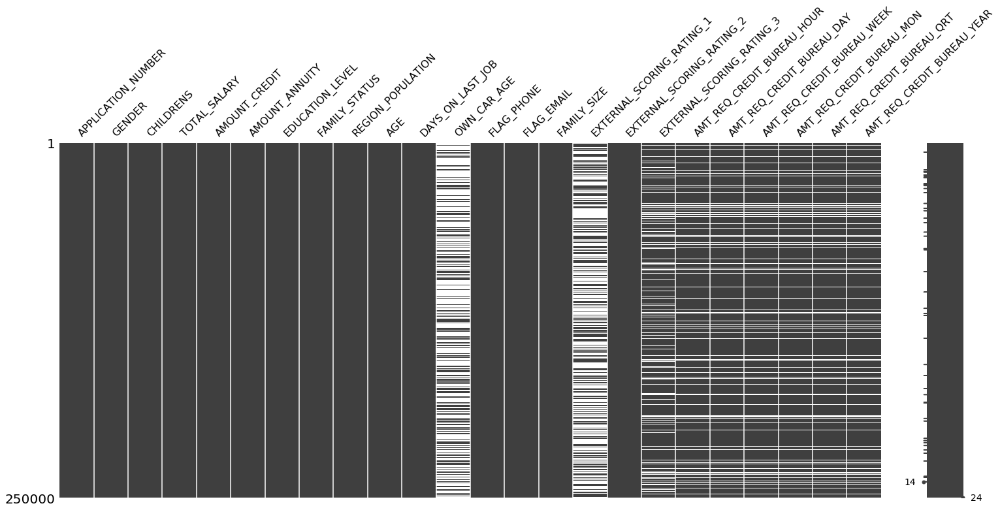

In [64]:
msno.matrix(client_profile)
# msno.bar(client_profile, labels=True)

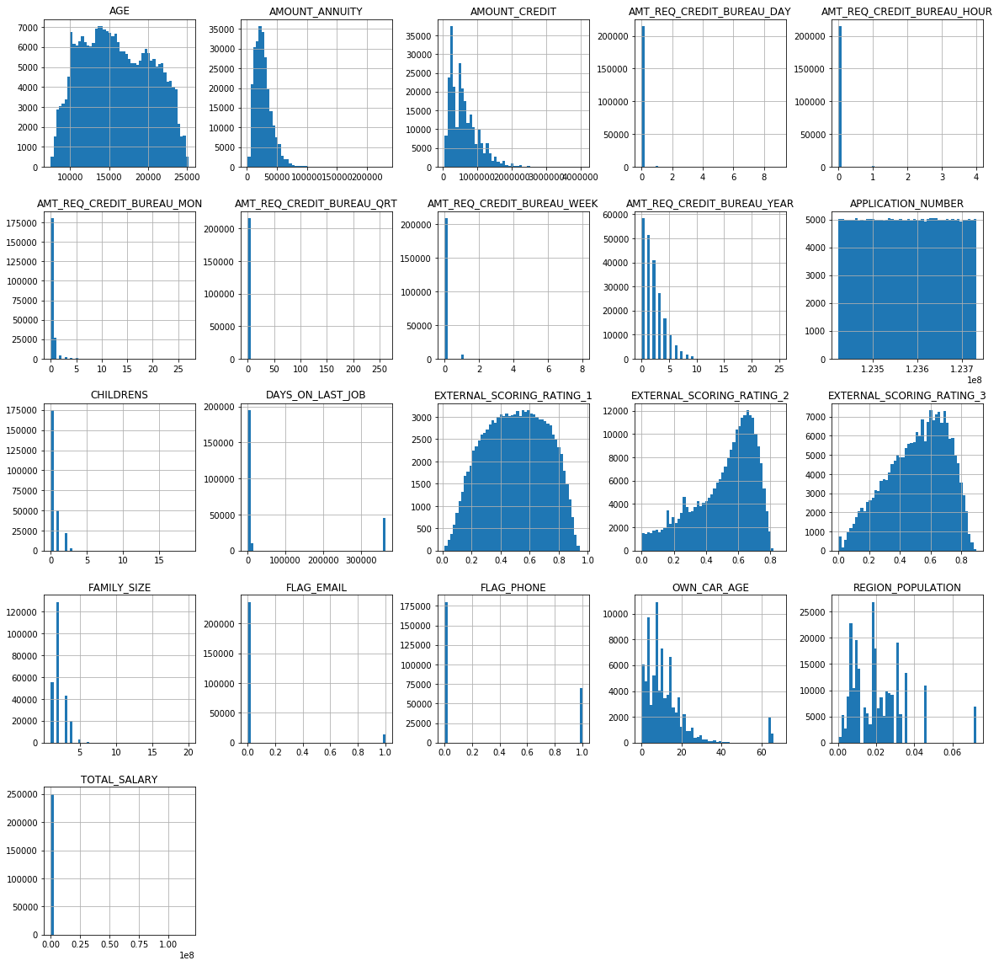

In [69]:
client_profile.hist(figsize=(20,20), bins=50)
plt.show()

In [73]:
train.shape, test.shape

((110093, 3), (165141, 2))

In [5]:
my_train = pd.merge(train, client_profile, on='APPLICATION_NUMBER', how='left')
my_test = pd.merge(test, client_profile, on='APPLICATION_NUMBER', how='left')

In [72]:
my_train.shape, my_test.shape

((110093, 26), (165141, 25))

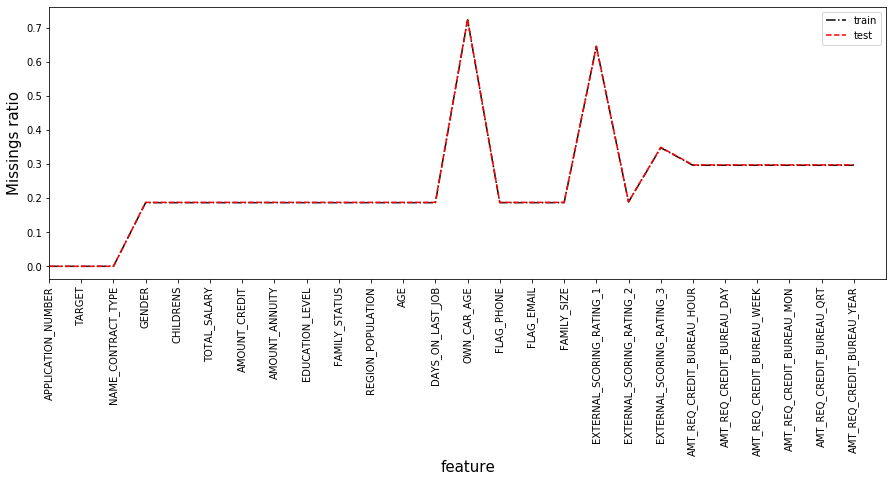

In [204]:
# Распределение выбросов на трейне и тесте, объединенных с profile, одинаковое.
fig = plt.figure(figsize=(15, 5))
plt.plot(my_train.isnull().mean(), label="train", color="black", linestyle='-.')
plt.plot(my_test.isnull().mean(), label="test", color="red", linestyle='--')
plt.xticks(range(my_train.shape[1]), my_train.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, my_train.shape[1])
plt.legend(loc="best")

In [268]:
# data = my_train.copy()
# data['TOTAL_SALARY'] = np.where(data['TOTAL_SALARY'].isnull(), 1, 0)
# statistics = data.groupby('TOTAL_SALARY')["TARGET"].median()

In [ ]:
# Посмотрим скольких пользователей недостает.

In [281]:
train['APPLICATION_NUMBER'].duplicated().sum(), client_profile['APPLICATION_NUMBER'].duplicated().sum()

(0, 0)

In [278]:
# difference = A - B - C
# print(f"разность множеств {difference}")
train_appl_num = set(train['APPLICATION_NUMBER'].values)
cp_appl_num = set(client_profile['APPLICATION_NUMBER'].values)

In [285]:
len(train_appl_num - cp_appl_num)

20554

In [ ]:
# В таблице с клиентскими профилями(client_profile) нет 20554 пользователя из таблицы трейн!

In [286]:
test['APPLICATION_NUMBER'].duplicated().sum(), client_profile['APPLICATION_NUMBER'].duplicated().sum()

(0, 0)

In [287]:
test_appl_num = set(test['APPLICATION_NUMBER'].values)

In [288]:
len(test_appl_num  - cp_appl_num)

30965

In [292]:
len(my_test.loc[my_test['TOTAL_SALARY'].isna()])

30965

In [ ]:
# В таблице с клиентскими профилями(client_profile) нет 30965 пользователей из таблицы тест!

In [ ]:
# Скильких недостает в остальных таблицах?

In [303]:
payments['APPLICATION_NUMBER'].duplicated().sum(), len(payments['APPLICATION_NUMBER'].unique()), payments.shape

(759206, 264726, (1023932, 8))

In [320]:
payments_appl_num = set(payments['APPLICATION_NUMBER'].values)
len(train_appl_num - payments_appl_num), len(test_appl_num - payments_appl_num)

(28126, 42568)

In [321]:
bki_appl_num = set(bki['APPLICATION_NUMBER'].values)
len(train_appl_num - bki_appl_num), len(test_appl_num - bki_appl_num)

(25585, 38672)

In [322]:
applications_history_appl_num = set(applications_history['APPLICATION_NUMBER'].values)
len(train_appl_num - applications_history_appl_num), len(test_appl_num - applications_history_appl_num)

(5437, 8057)

In [331]:
# Теперь все вместе на трейне
len(train_appl_num - cp_appl_num - payments_appl_num - bki_appl_num - applications_history_appl_num)

287

In [329]:
# Теперь все вместе на тесте
len(test_appl_num - cp_appl_num - payments_appl_num - bki_appl_num - applications_history_appl_num)

361

In [90]:
my_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110093 entries, 0 to 110092
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   APPLICATION_NUMBER          110093 non-null  int32   
 1   TARGET                      110093 non-null  int8    
 2   NAME_CONTRACT_TYPE          110093 non-null  category
 3   GENDER                      89539 non-null   category
 4   CHILDRENS                   89539 non-null   float64 
 5   TOTAL_SALARY                89539 non-null   float32 
 6   AMOUNT_CREDIT               89539 non-null   float32 
 7   AMOUNT_ANNUITY              89534 non-null   float32 
 8   EDUCATION_LEVEL             89539 non-null   category
 9   FAMILY_STATUS               89539 non-null   category
 10  REGION_POPULATION           89539 non-null   float32 
 11  AGE                         89539 non-null   float64 
 12  DAYS_ON_LAST_JOB            89539 non-null   float64 
 13 

In [6]:
cols = my_train.select_dtypes(include=[np.number]).columns.tolist()
cols

['APPLICATION_NUMBER',
 'TARGET',
 'CHILDRENS',
 'TOTAL_SALARY',
 'AMOUNT_CREDIT',
 'AMOUNT_ANNUITY',
 'REGION_POPULATION',
 'AGE',
 'DAYS_ON_LAST_JOB',
 'OWN_CAR_AGE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'FAMILY_SIZE',
 'EXTERNAL_SCORING_RATING_1',
 'EXTERNAL_SCORING_RATING_2',
 'EXTERNAL_SCORING_RATING_3',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

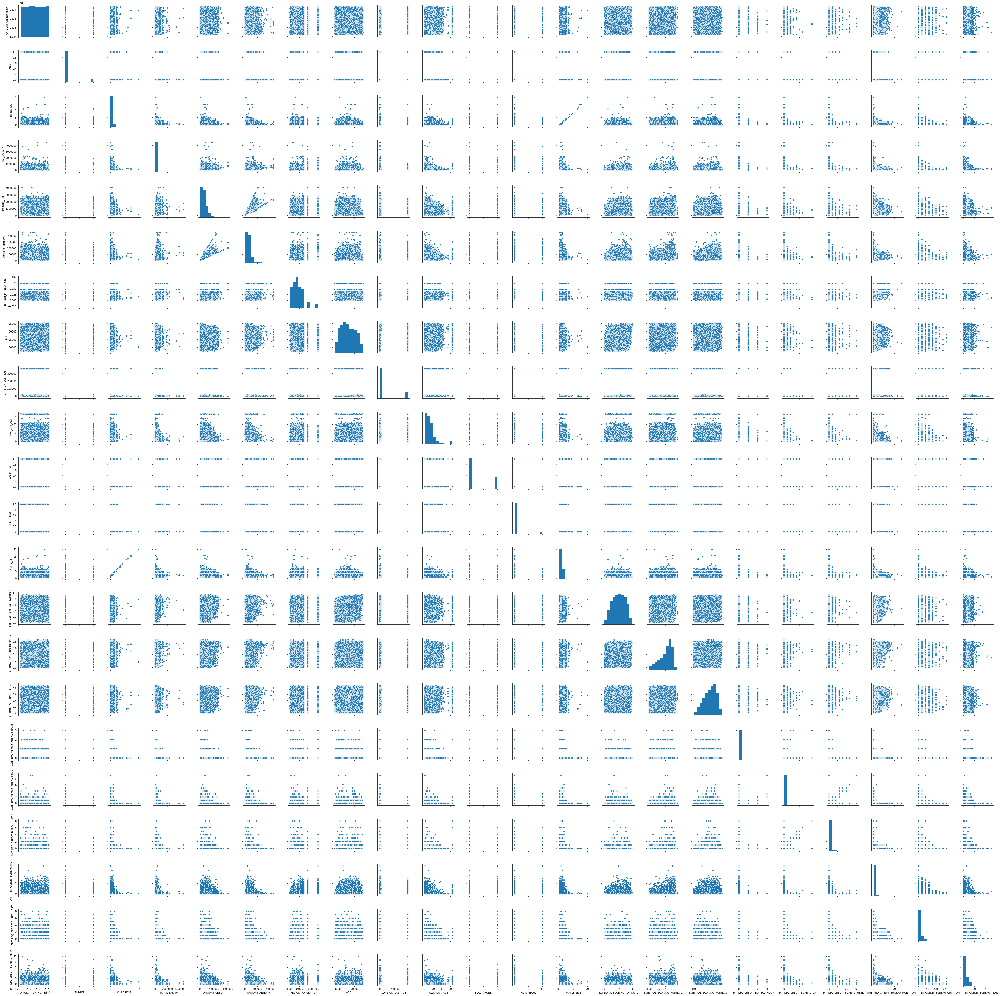

In [88]:
sns.pairplot(my_train)

Text(0, 0.5, 'DAYS_ON_LAST_JOB')

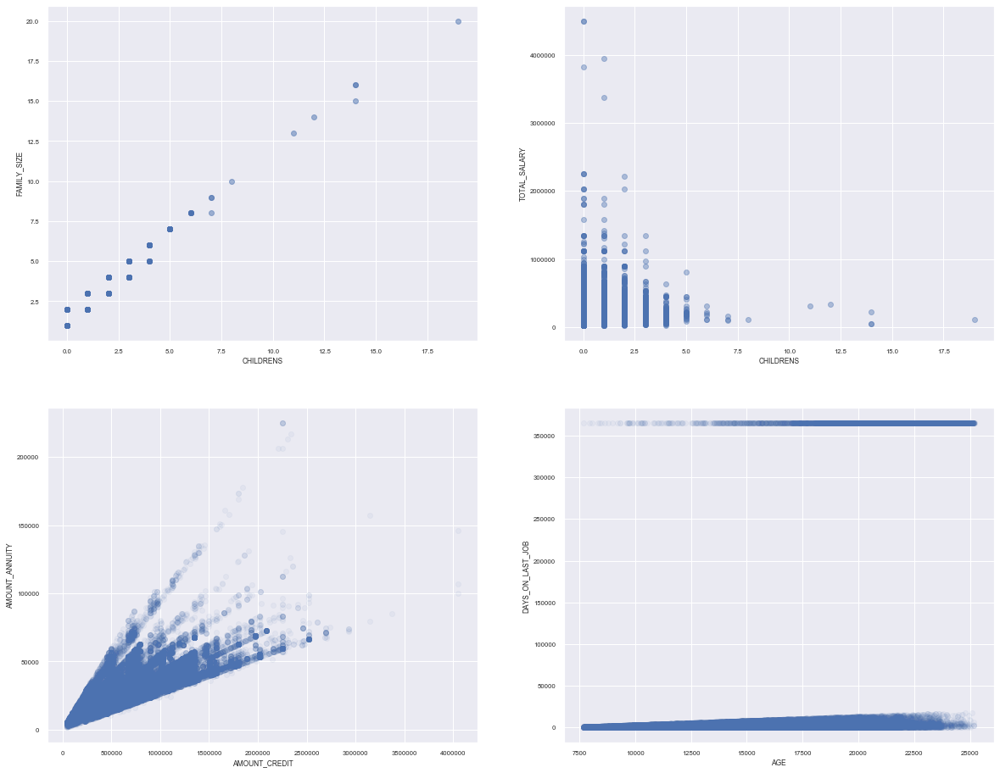

In [359]:
plt.figure(figsize = (20, 16))
plt.subplot(221)
plt.scatter(my_train['CHILDRENS'], my_train['FAMILY_SIZE'], alpha=0.5)
plt.xlabel('CHILDRENS')
plt.ylabel('FAMILY_SIZE')
plt.subplot(222)
plt.scatter(my_train['CHILDRENS'], my_train['TOTAL_SALARY'], alpha=0.4)
plt.xlabel('CHILDRENS')
plt.ylabel('TOTAL_SALARY')
plt.subplot(223)
plt.scatter(my_train['AMOUNT_CREDIT'], my_train['AMOUNT_ANNUITY'], alpha=0.05)
plt.xlabel('AMOUNT_CREDIT')
plt.ylabel('AMOUNT_ANNUITY')
plt.subplot(224)
plt.scatter(my_train['AGE'], my_train['DAYS_ON_LAST_JOB'], alpha=0.05)
plt.xlabel('AGE')
plt.ylabel('DAYS_ON_LAST_JOB')

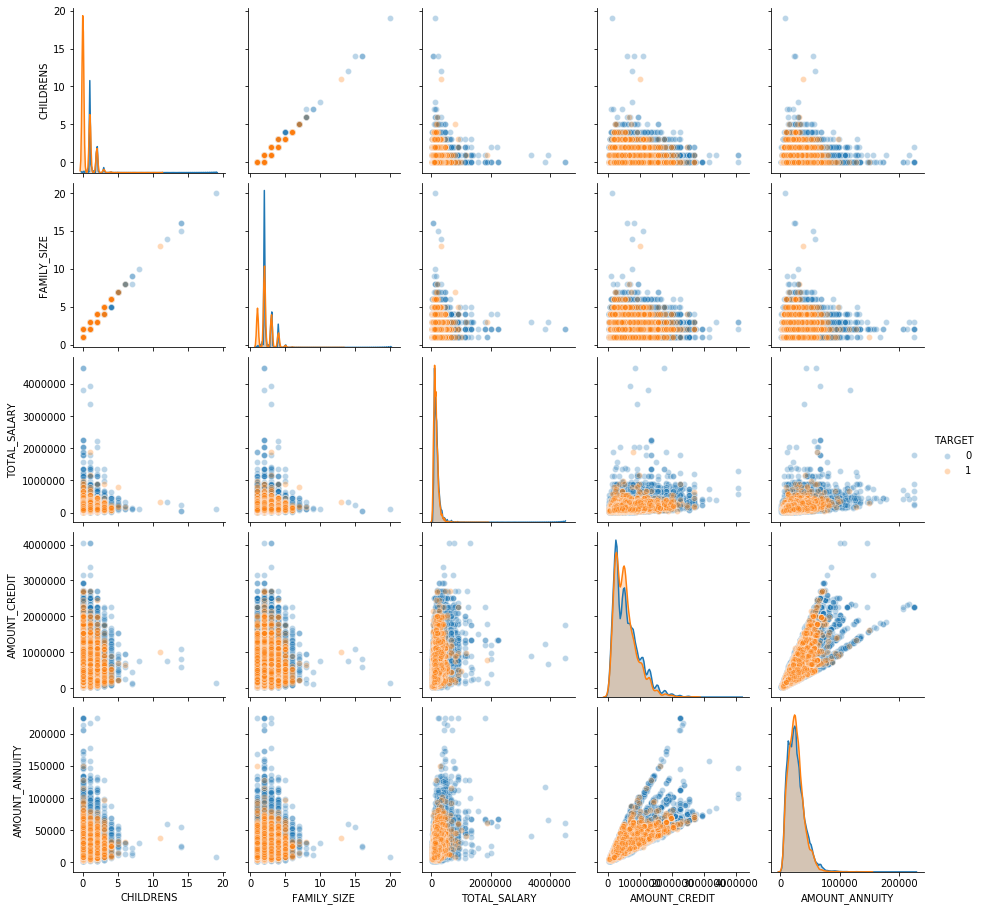

In [138]:
sns.pairplot(my_train[['TARGET', 'CHILDRENS', 'FAMILY_SIZE', 'TOTAL_SALARY', 'AMOUNT_CREDIT', 'AMOUNT_ANNUITY']], hue='TARGET',  plot_kws = {'alpha': 0.3})

In [ ]:
# Анализ целевой переменной

In [117]:
my_train['TARGET'].value_counts()

0    101196
1      8897
Name: TARGET, dtype: int64

In [118]:
disbalance = my_train['TARGET'].value_counts().values[0] / my_train['TARGET'].value_counts().values[1]
disbalance

11.37417106889963

In [226]:
# colss = my_train.select_dtypes(exclude=['object', 'category']).columns.tolist()
colss = ['APPLICATION_NUMBER',
#  'TARGET',
 'CHILDRENS',
 'TOTAL_SALARY',
 'AMOUNT_CREDIT',
 'AMOUNT_ANNUITY',
 'REGION_POPULATION',
 'AGE',
 'DAYS_ON_LAST_JOB',
 'OWN_CAR_AGE',
 'FLAG_PHONE',
#  'FLAG_EMAIL',
 'FAMILY_SIZE',
 'EXTERNAL_SCORING_RATING_1',
 'EXTERNAL_SCORING_RATING_2',
 'EXTERNAL_SCORING_RATING_3',
#  'AMT_REQ_CREDIT_BUREAU_HOUR',
#  'AMT_REQ_CREDIT_BUREAU_DAY',
#  'AMT_REQ_CREDIT_BUREAU_WEEK',
#  'AMT_REQ_CREDIT_BUREAU_MON',
#  'AMT_REQ_CREDIT_BUREAU_QRT',
#  'AMT_REQ_CREDIT_BUREAU_YEAR'
        ]

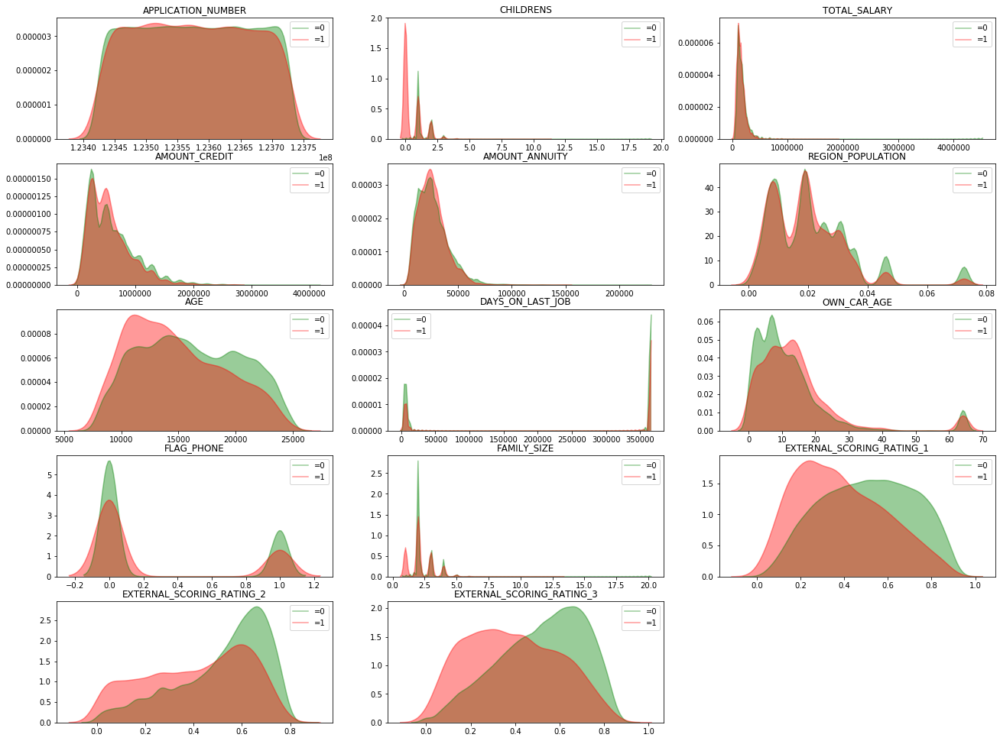

In [197]:
plt.figure(figsize = (22, 24))
for num, feature in enumerate(colss, start=1):
    plt.subplot(7, 3, num)
    v_zero = my_train.loc[(my_train['TARGET'] == 0), feature]
    v_one = my_train.loc[(my_train['TARGET'] == 1), feature]
    sns.kdeplot(data=v_zero, shade=True, color="g", label="=0", alpha=.4)
    sns.kdeplot(v_one, shade=True, color="r", label="=1", alpha=.4)
    plt.title(feature)

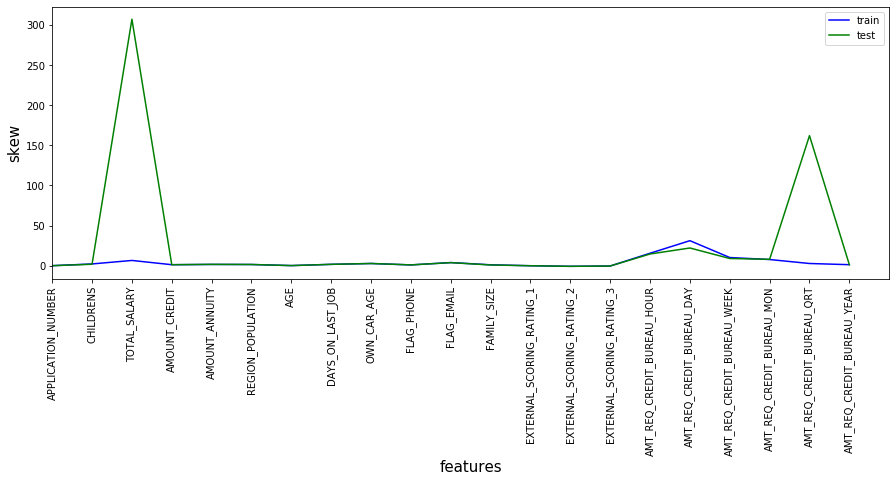

In [199]:
# Скос
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train.drop('TARGET', axis=1).skew(), my_test.skew()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.xlim(0, len(train_stats))
plt.ylabel("skew", size=15)
plt.legend()
plt.show()

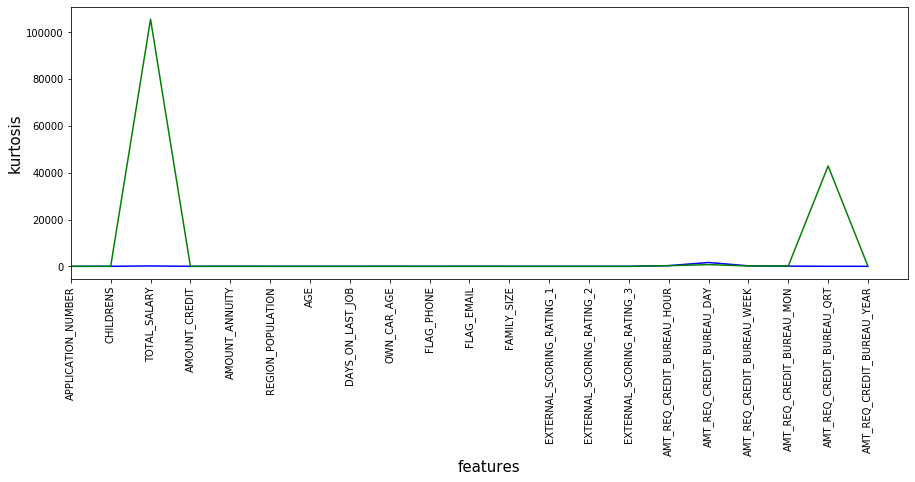

In [201]:
# Куртосис
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train.drop('TARGET', axis=1).kurtosis(), my_test.kurtosis()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.ylabel("kurtosis", size=15)
plt.xlim(0, len(train_stats))
plt.show()

In [247]:
my_test['TOTAL_SALARY'].max()

117000000.0

In [248]:
my_train['TOTAL_SALARY'].max()

4500000.0

In [260]:
my_test['AMT_REQ_CREDIT_BUREAU_QRT'].max(), my_test['AMT_REQ_CREDIT_BUREAU_QRT'].quantile(0.9999)

(261.0, 6.0)

In [261]:
my_train['AMT_REQ_CREDIT_BUREAU_QRT'].max(), my_test['AMT_REQ_CREDIT_BUREAU_QRT'].quantile(0.9999)

(8.0, 6.0)

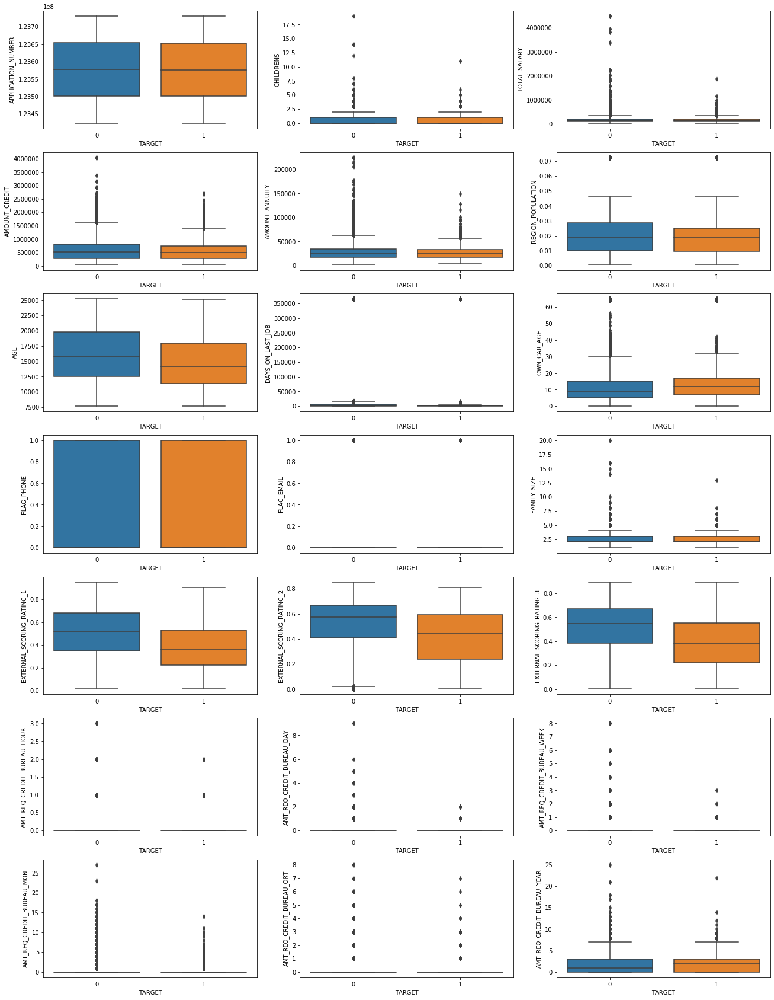

In [213]:
plt.figure(figsize = (22, 30))
for num, feature in enumerate(my_train.select_dtypes(exclude=['object', 'category']).columns.tolist(), start=1):
    plt.subplot(7, 3, num)
    sns.boxplot(x=my_train['TARGET'], y=feature, data=my_train)

Mean-target: 0.0808


Text(0, 0.5, 'Index')

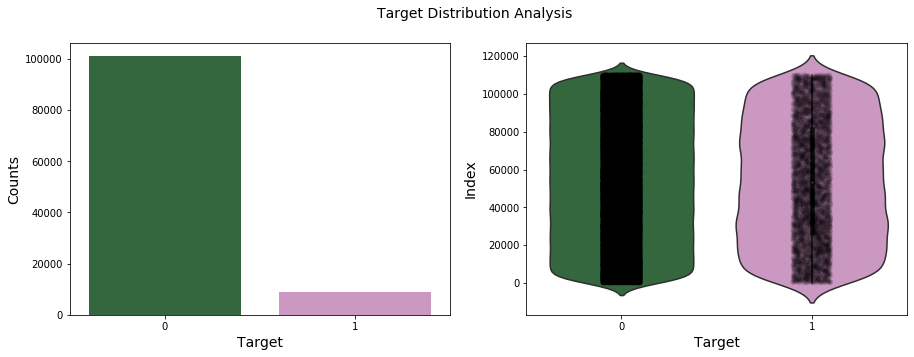

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle("Target Distribution Analysis", size=14)
print(f"Mean-target: {round(my_train['TARGET'].mean(), 4)}")

sns.countplot(my_train['TARGET'], ax=axes[0], palette="cubehelix")
sns.violinplot(my_train['TARGET'], my_train.index, ax=axes[1], palette="cubehelix")
sns.stripplot(my_train['TARGET'], my_train.index, jitter=True, ax=axes[1], color="black", alpha=0.05)

axes[0].set_xlabel("Target", fontsize=14)
axes[0].set_ylabel("Counts", fontsize=14)
axes[1].set_xlabel("Target", fontsize=14)
axes[1].set_ylabel("Index", fontsize=14)

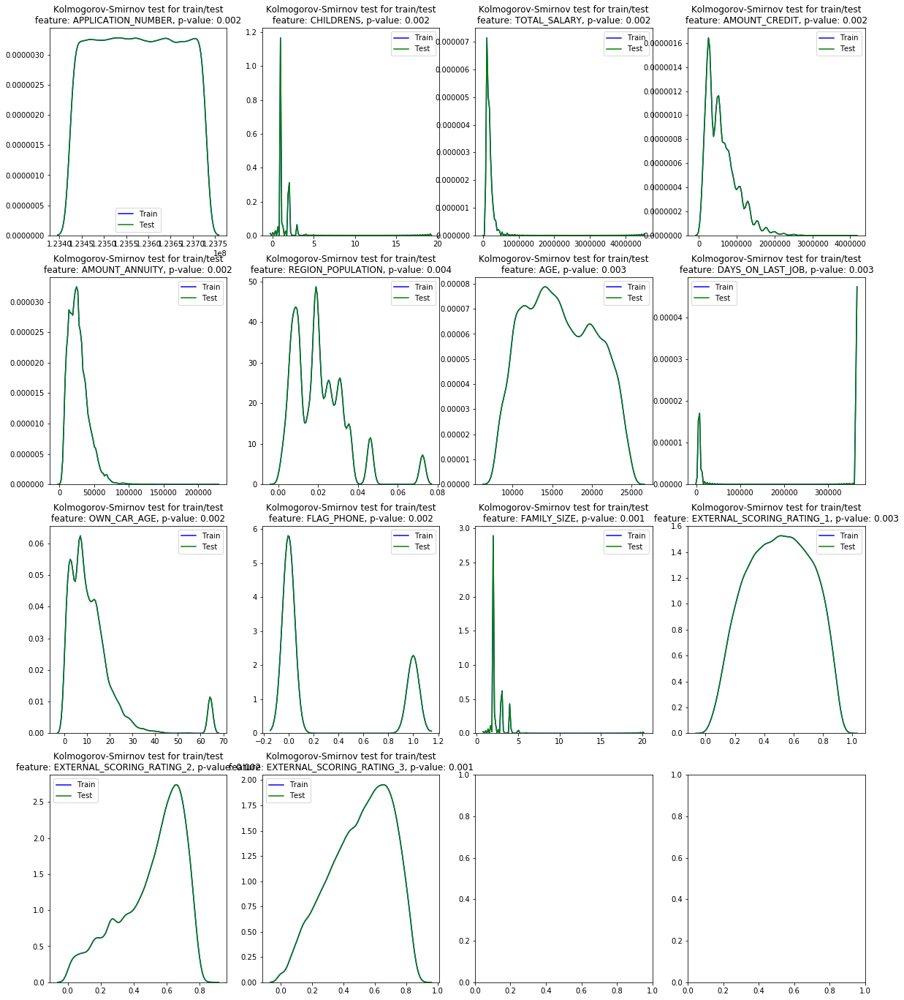

In [233]:
statistics_array = []
# collss = my_train.drop('TARGET', axis=1).select_dtypes(exclude=['object', 'category']).columns.tolist()
fig, axes = plt.subplots(4, 4, figsize=(20, 24))

for num, feature in enumerate(my_train[colss].columns):
    statistic, pvalue = ks_2samp(
        my_train[feature], my_test[feature]
    )
    statistics_array.append(statistic)

    sns.kdeplot(my_train[feature], ax=axes[num//4, num%4], color="Blue", label="Train")
    sns.kdeplot(my_train[feature], ax=axes[num//4, num%4], color="Green", label="Test")

    axes[num//4, num%4].set_title(
        (f"Kolmogorov-Smirnov test for train/test\n"
        f"feature: {feature}, p-value: {round(statistic, 3)}")
    )

In [27]:
# Population Stability Index
class PSI(BaseEstimator, TransformerMixin):
    """
    Вычисление PSI и отбор признаков на их основе.

    Parameters
    ----------
    threshold: float
        Порог для отбора переменных по PSI.
        Если PSI для переменной выше порога - переменная макрируется
        0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

    categorical_features: List[str], optional, default = None
        Список категориальных признаков для анализа.
        Опциональный параметр, по умолчанию, не используется, т.е.
        категориальные признаки отсутствуют.

    n_bins: int, optional, default = 20
        Количество бинов, на которые разбивается выборка.

    min_value: float, optional, default = 0.005
        Значение которое используется, если рассчитанный psi = 0.

    bin_type: string, optional, default = "quanitles"
        Способ разбиения на бины: "quantiles" or "bins".
        При выборе "quantiles" - выборка будет разбита на n_bins
        квантилей, при выборке "bins" - выборка будет разбита на
        n_bins бакетов с равным шагом между бакетами.
        Иные значения приводят к возникновению ValueError.

    Attributes
    ----------
    scores_: Dict[str, float]
        Словарь со значениями PSI,
        ключ словаря - название признака, значение - PSI-score.

    """
    def __init__(self,
                 threshold: float,
                 categorical_features: Optional[List[str]] = None,
                 bin_type: str = "quantiles",
                 min_value: float = 0.005,
                 n_bins: int = 20):

        self.threshold = threshold
        self.categorical_features = categorical_features
        self.min_value = min_value
        self.n_bins = n_bins
        if bin_type in ["quantiles", "bins"]:
            self.bin_type = bin_type
        else:
            raise ValueError(
                "Incorrect bin_type value. Expected 'quantiles' or 'bins', "
                f"but {bin_type} is transferred."
            )
        self.scores = {}

    def calculate_bins(self, data: pd.Series) -> np.array:
        """
        Вычисление границ бинов для разбиения выборки.

        Parameters
        ----------
        data: pandas.Series, shape = [n_samples, ]
            наблюдения из train-выборки.

        Returns
        -------
        bins: numpy.array, shape = [self.n_bins + 1]
            Список с границами бинов.

        """
        if self.bin_type == "quantiles":
            bins = np.linspace(0, 100, self.n_bins + 1)
            bins = [np.nanpercentile(data, x) for x in bins]

        else:
            bins = np.linspace(data.min(), data.max(), self.n_bins + 1)

        return np.unique(bins)

    def calculate_psi_in_bin(self, expected_score, actual_score) -> float:
        """
        Вычисление значения psi для одного бакета.

        Осуществляется проверка на равенство нулю expected_score и
        actual_score: если один из аргументов равен нулю, то его
        значение заменяется на self.min_value.

        Parameters
        ----------
        expected_score: float
            Ожидаемое значение.

        actual_score: float
            Наблюдаемое значение.

        Returns
        -------
        value: float
            Значение psi в бине.

        """
        if expected_score == 0:
            expected_score = self.min_value
        if actual_score == 0:
            actual_score = self.min_value

        value = (expected_score - actual_score)
        value = value * np.log(expected_score / actual_score)

        return value

    def calculate_psi(self, expected: pd.Series, actual: pd.Series, bins) -> float:
        """
        Расчет PSI для одной переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        bins: pandas.Series, shape = [self.n_bins, ]
            Бины для расчета PSI.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        expected_score = np.histogram(expected.fillna(-9999), bins)[0]
        expected_score = expected_score / expected.shape[0]

        actual_score = np.histogram(actual.fillna(-9999), bins)[0]
        actual_score = actual_score / actual.shape[0]

        psi_score = np.sum(
            self.calculate_psi_in_bin(exp_score, act_score)
            for exp_score, act_score in zip(expected_score, actual_score)
        )

        return psi_score

    def calculate_numeric_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для числовой переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = self.calculate_bins(expected)
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def calculate_categorical_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для категориальной переменной.
        PSI рассчитывается для каждого уникального значения категории.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = np.unique(expected).tolist()
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def fit(self, X, y=None):
        """
        Вычисление PSI-значения для всех признаков.

        Parameters
        ----------
        X: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        y: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        self
        """
        missed_columns = list(set(X.columns) - set(y.columns))

        if missed_columns:
            raise MissedColumnError(
                f"Missed {list(missed_columns)} columns in data.")

        if self.categorical_features:
            numeric_features = list(
                set(X.columns) - set(self.categorical_features)
            )
            for feature in self.categorical_features:
                self.scores[feature] = self.calculate_categorical_psi(
                    X[feature], y[feature]
                )
        else:
            numeric_features = X.columns

        for feature in tqdm(numeric_features):
            self.scores[feature] = self.calculate_numeric_psi(
                X[feature], y[feature]
            )
        return self

    def transform(self, X, y=None) -> pd.DataFrame:
        """
        Отбор переменных по self.threshold.
        Если PSI-score для переменной выше порога, то переменная
        помечается 0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

        Parameters
        ----------
        data: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        target: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        scores: pandas.DataFrame, shape = [n_features, 3]
            Датафрейм с PSI-анализом переменных.

        """
        check_is_fitted(self, "scores")
        scores = pd.Series(self.scores)
        scores = pd.DataFrame({"Variable": scores.index, "PSI": scores.values})
        scores["Selected"] = np.where(scores.PSI < self.threshold, 1, 0)
        scores = scores.sort_values(by="PSI")

        mask = scores["Selected"] == 1
        self.used_features = scores.loc[mask, "Variable"].tolist()

        return scores.reset_index(drop=True)


In [236]:
features_to_score = my_train.drop('TARGET', axis=1).select_dtypes(exclude=['object', 'category']).columns.tolist()
psi = PSI(threshold=0.01)

In [237]:
psi.fit_transform(
    X=my_train[features_to_score],
    y=my_test[features_to_score]
)

100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 27.06it/s]


,Variable,PSI,Selected
0,FLAG_EMAIL,8.065780e-07,1
1,FLAG_PHONE,8.065780e-07,1
2,AMT_REQ_CREDIT_BUREAU_WEEK,1.766456e-06,1
3,AMT_REQ_CREDIT_BUREAU_DAY,1.766456e-06,1
4,AMT_REQ_CREDIT_BUREAU_HOUR,1.785710e-06,1
5,AMT_REQ_CREDIT_BUREAU_QRT,1.482436e-05,1
6,AMT_REQ_CREDIT_BUREAU_MON,1.795051e-05,1
7,FAMILY_SIZE,2.766104e-05,1
8,CHILDRENS,4.425611e-05,1
9,AMT_REQ_CREDIT_BUREAU_YEAR,5.819690e-05,1


In [240]:
# Для того, чтобы учесть взаимодействие признаков и характер модели сделаем следующее:
# Adversarial Validation

In [241]:
X_adv = pd.concat([
    my_train[features_to_score], my_test[features_to_score]
])
y_adv = np.hstack(
    (np.ones(my_train.shape[0]), np.zeros(my_test.shape[0])))

X_adv = X_adv.reset_index(drop=True)

In [242]:
%%time
parameters = {"max_depth": 4, "n_estimators": 50, "random_state": 27, "n_jobs": 2}
model = xgb.XGBClassifier(**parameters)

cv = cross_val_score(
    estimator=model,
    X=X_adv, y=y_adv,
    scoring="roc_auc",
    cv=KFold(n_splits=3, shuffle=True, random_state=27)
)
print(f"CV-score: {round(np.mean(cv), 4)}")

[21:27:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:27:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
CV-score: 0.5
Wall time: 19.8 s


[21:28:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Text(0.5, 1.0, 'Top Importance Features for Adversarial Validation (train vs test)')

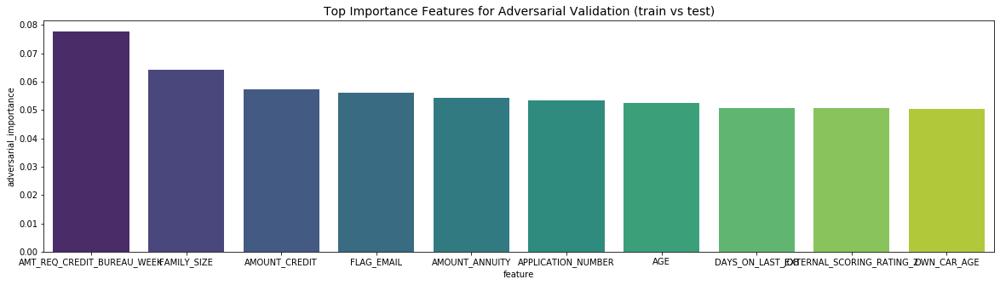

In [243]:
model.fit(X_adv, y_adv)

importance = pd.DataFrame({
    "feature": X_adv.columns,
    "adversarial_importance": model.feature_importances_
})
importance = importance.sort_values(by="adversarial_importance", ascending=False)
importance = importance.head(n=10)

plt.figure(figsize=(20, 5))
sns.barplot(x=importance["feature"], y=importance["adversarial_importance"], palette="viridis")
plt.title("Top Importance Features for Adversarial Validation (train vs test)", size=14)

In [ ]:
# Распределение статистик

In [343]:
table1 = my_train.drop('APPLICATION_NUMBER', axis=1).groupby('TARGET').mean()
table1.reset_index(inplace=True)
table1

,TARGET,CHILDRENS,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,FLAG_PHONE,...,FAMILY_SIZE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.415992,168966.078125,603271.3125,27168.619141,0.020996,16135.263570,69326.432462,11.953556,0.284401,...,2.154318,0.510977,0.522928,0.521190,0.005970,0.006809,0.034031,0.269857,0.265845,1.892440
1,1,0.478635,160977.453125,559523.3125,26560.417969,0.019101,14825.440067,43664.425083,13.897367,0.256937,...,2.198113,0.384292,0.410646,0.389351,0.007218,0.006379,0.035588,0.227296,0.259191,2.037603


In [342]:
table2 = my_train.drop('APPLICATION_NUMBER', axis=1).groupby('TARGET').std()
table2.reset_index(inplace=True)
table2 

,TARGET,CHILDRENS,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,FLAG_PHONE,...,FAMILY_SIZE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.725645,100795.169408,407321.140645,14652.889408,0.013947,4355.733239,140706.587845,11.886680,0.451131,...,0.911665,0.207592,0.186533,0.190823,0.082640,0.113150,0.207827,0.918816,0.613382,1.866588
1,1,0.761636,84753.762489,349812.021749,12653.562976,0.011813,4167.477184,116028.153547,12.361815,0.436975,...,0.956461,0.202923,0.212982,0.205054,0.090415,0.089546,0.189754,0.722404,0.629717,1.969187


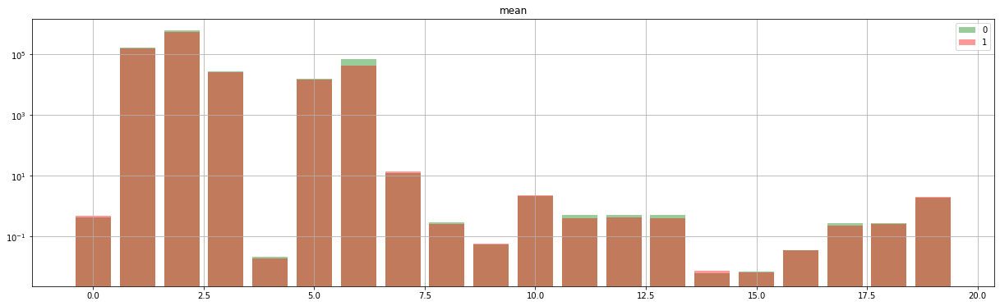

In [353]:
plt.figure(figsize=(21, 6))
plt.bar(range(len(table1.loc[table1['TARGET'] == 0].columns.tolist()[1:])),
        table1.loc[table1['TARGET'] == 0].values[0].tolist()[1:], alpha=0.4, log=True, color='g', label='0')
plt.bar(range(len(table1.loc[table1['TARGET'] == 1].columns.tolist()[1:])),
        table1.loc[table1['TARGET'] == 1].values[0].tolist()[1:], alpha=0.4, log=True, color='red', label='1')
plt.title('mean')
plt.legend()
plt.grid()

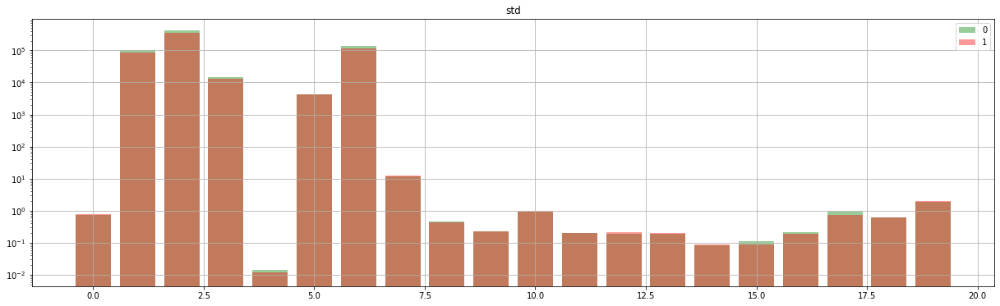

In [354]:
plt.figure(figsize=(21, 6))
plt.bar(range(len(table2.loc[table2['TARGET'] == 0].columns.tolist()[1:])),
        table2.loc[table2['TARGET'] == 0].values[0].tolist()[1:], alpha=0.4, log=True, color='g', label='0')
plt.bar(range(len(table2.loc[table2['TARGET'] == 1].columns.tolist()[1:])),
        table2.loc[table2['TARGET'] == 1].values[0].tolist()[1:], alpha=0.4, log=True, color='red', label='1')
plt.title('std')
plt.legend()
plt.grid()

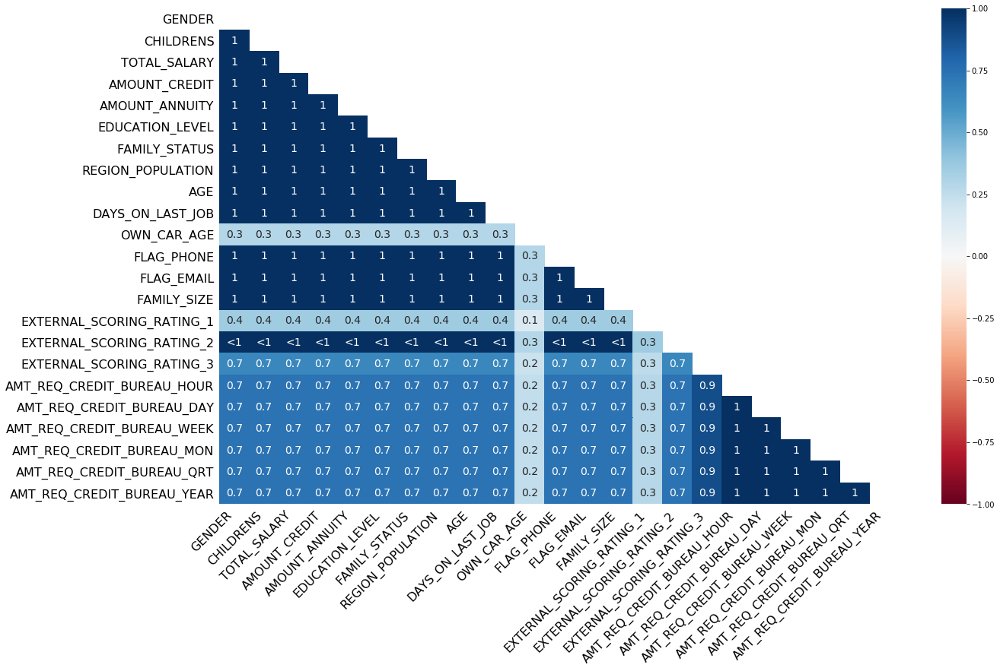

In [262]:
# Корреляция между пропусками и расположением пропусков
msno.heatmap(my_train)

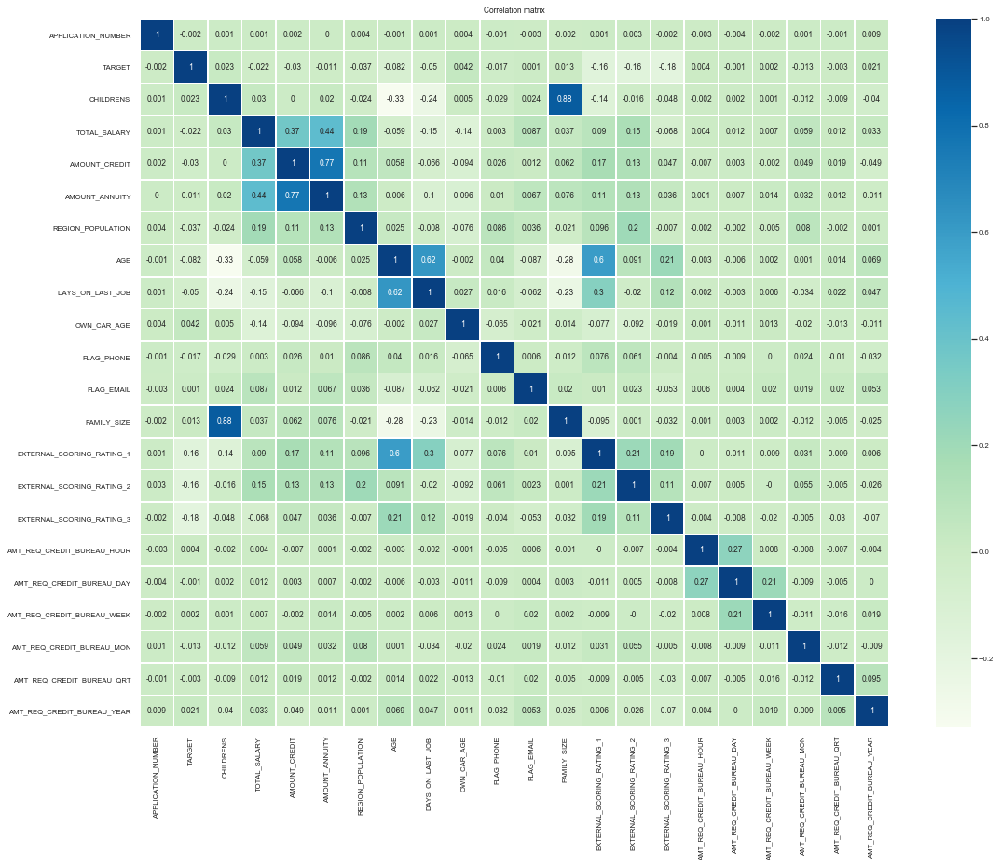

In [356]:
plt.figure(figsize = (18,14))
sns.set(font_scale=0.7)
sns.heatmap( my_train.corr().round(3), annot=True, linewidths=.5, cmap='GnBu')
plt.title('Correlation matrix')
plt.show()

In [19]:
# parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}
for ii in my_train.select_dtypes(include=['object', 'category']).columns.tolist():
    my_train[ii] = my_train[ii].astype(str)

params = {'n_estimators': 200, 'silent': True, 'learning_rate': 0.1, 'depth': 3, "early_stopping_rounds": 20, 'random_state': 99}

cat_features_idx1 = np.where(my_train.drop('TARGET', axis=1).dtypes == 'object')[0].tolist()

ctb = CatBoostClassifier(**params)
ctb.fit(my_train.drop('TARGET', axis=1).fillna(-9999), my_train['TARGET'], cat_features=cat_features_idx1, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Text(0.5, 1.0, 'What are the top important features to start with?')

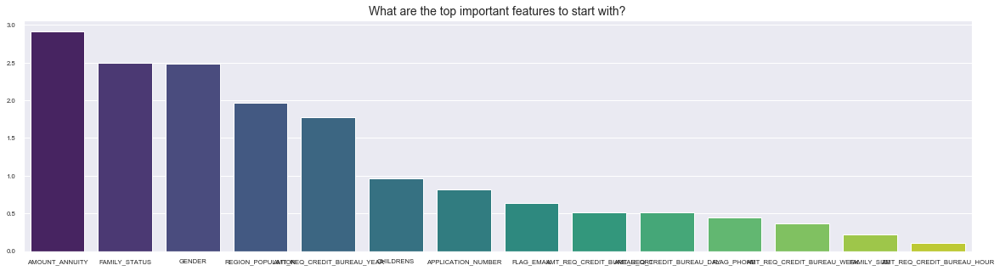

In [395]:
n_top = -1
importances = ctb.feature_importances_
idx = np.argsort(importances)[::-1][10:n_top]
feature_names = my_train.drop('TARGET', axis=1).columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

In [ ]:
# На удаление:
# CHILDRENS
# FLAG_EMAIL
# FLAG_PHONE
# FAMILY_SIZE
# AMT_REQ_CREDIT_BUREAU_DAY
# AMT_REQ_CREDIT_BUREAU_WEEK
# AMT_REQ_CREDIT_BUREAU_HOUR
# AMT_REQ_CREDIT_BUREAU_YEAR
# AMT_REQ_CREDIT_BUREAU_QRT

In [20]:
# Сразу сделаем прогноз на тесте, чтобы потом сравнить прогнозы на каждой выборке
for ii in my_test.select_dtypes(include=['object', 'category']).columns.tolist():
    my_test[ii] = my_test[ii].astype(str)
    
predict1 = ctb.predict_proba(my_test)
predict1[:,1]

### 2. АНАЛИЗ train и payments <a class='anchor' id='train_payments'>

In [25]:
my_train2 = pd.merge(train, payments, on='APPLICATION_NUMBER', how='left')
my_test2 = pd.merge(test, payments, on='APPLICATION_NUMBER', how='left')

In [26]:
my_train2.head()

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE,PREV_APPLICATION_NUMBER,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,123687442,0,Cash,49796018.0,1.0,4.0,2830.0,2830.0,3289.635010,3289.635010
1,123687442,0,Cash,49796018.0,1.0,7.0,2740.0,2740.0,3289.635010,3289.635010
2,123687442,0,Cash,49713743.0,1.0,5.0,2551.0,2547.0,9262.214844,9251.865234
3,123687442,0,Cash,49713743.0,1.0,7.0,2491.0,2519.0,9262.214844,10.350000
4,123597908,1,Cash,49672074.0,1.0,9.0,450.0,457.0,11349.900391,11349.900391


In [10]:
my_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 345065 entries, 0 to 345064
Data columns (total 10 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   APPLICATION_NUMBER       345065 non-null  int32   
 1   TARGET                   345065 non-null  int8    
 2   NAME_CONTRACT_TYPE       345065 non-null  category
 3   PREV_APPLICATION_NUMBER  316939 non-null  float64 
 4   NUM_INSTALMENT_VERSION   316939 non-null  float32 
 5   NUM_INSTALMENT_NUMBER    316939 non-null  float64 
 6   DAYS_INSTALMENT          316939 non-null  float32 
 7   DAYS_ENTRY_PAYMENT       316882 non-null  float32 
 8   AMT_INSTALMENT           316939 non-null  float32 
 9   AMT_PAYMENT              316882 non-null  float32 
dtypes: category(1), float32(5), float64(2), int32(1), int8(1)
memory usage: 16.5 MB


In [15]:
my_train2.describe()

,APPLICATION_NUMBER,TARGET,PREV_APPLICATION_NUMBER,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,3.450650e+05,345065.000000,3.169390e+05,316939.000000,316939.000000,316939.000000,316882.000000,3.169390e+05,3.168820e+05
mean,1.235772e+08,0.080205,4.917387e+07,0.857619,18.892863,1041.277466,1050.159912,1.716652e+04,1.741152e+04
std,8.872069e+04,0.271611,5.366284e+05,1.026615,26.704521,800.202332,799.872620,5.128712e+04,5.585695e+04
min,1.234233e+08,0.000000,4.826822e+07,0.000000,1.000000,2.000000,2.000000,0.000000e+00,0.000000e+00
25%,1.235010e+08,0.000000,4.870260e+07,0.000000,4.000000,361.000000,370.000000,4.241992e+03,3.435908e+03
50%,1.235769e+08,0.000000,4.917013e+07,1.000000,8.000000,817.000000,826.000000,8.885205e+03,8.147700e+03
75%,1.236538e+08,0.000000,4.963922e+07,1.000000,19.000000,1651.000000,1660.000000,1.676903e+04,1.618492e+04
max,1.237308e+08,1.000000,5.011171e+07,43.000000,254.000000,2922.000000,3054.000000,2.383749e+06,2.476718e+06


In [80]:
my_train2.APPLICATION_NUMBER.duplicated().sum()

234972

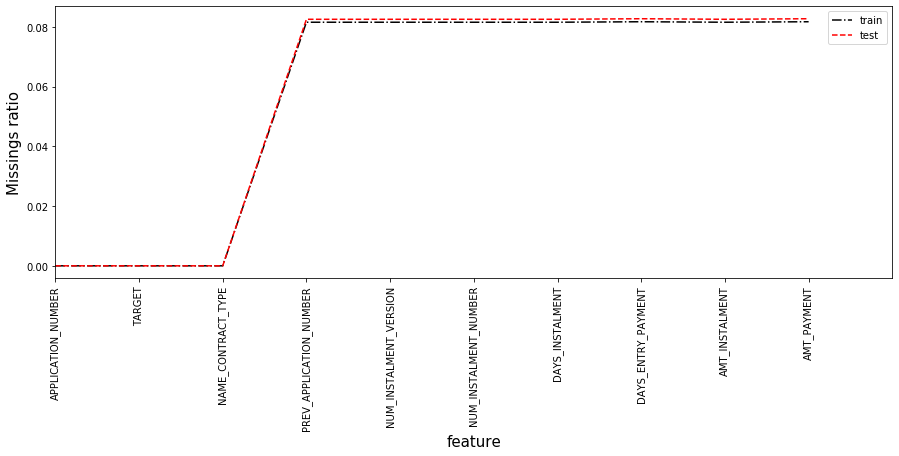

In [16]:
fig = plt.figure(figsize=(15, 5))
plt.plot(my_train2.isnull().mean(), label="train", color="black", linestyle='-.')
plt.plot(my_test2.isnull().mean(), label="test", color="red", linestyle='--')
plt.xticks(range(my_train2.shape[1]), my_train2.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, my_train2.shape[1])
plt.legend(loc="best")

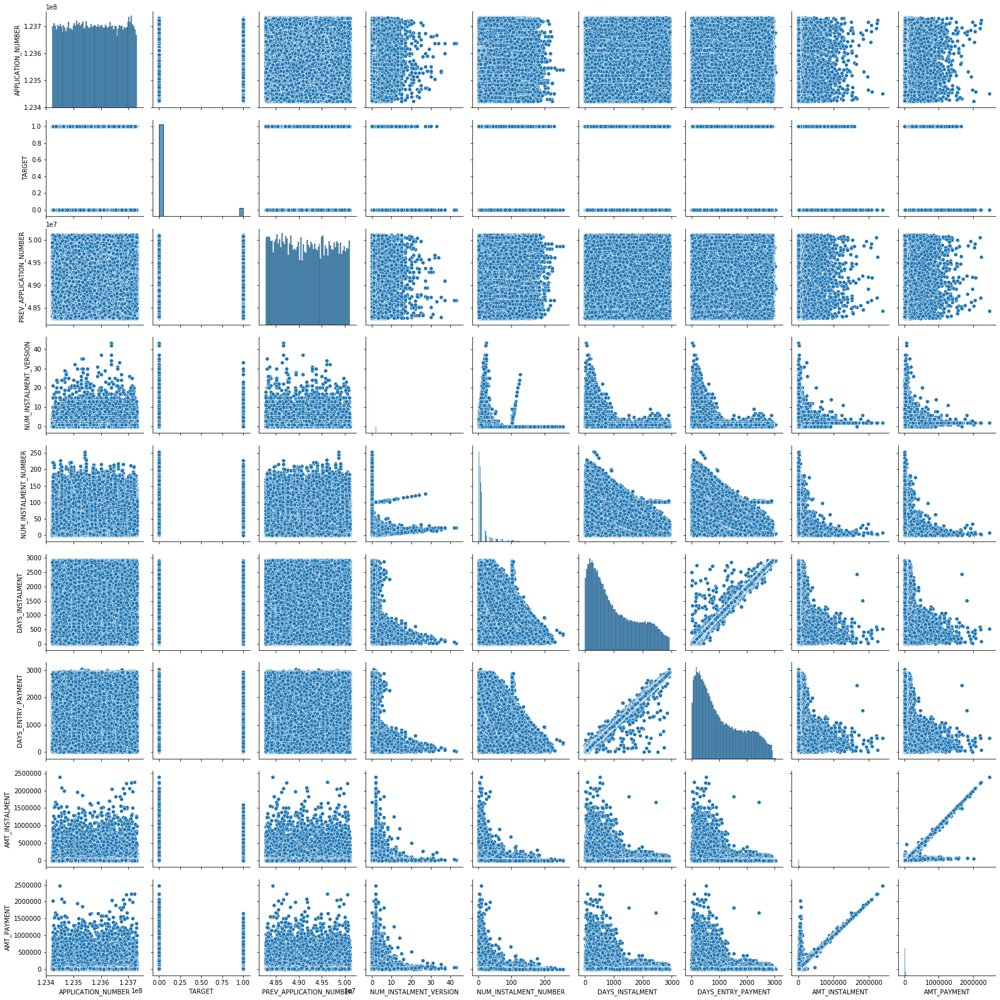

In [17]:
sns.pairplot(my_train2)

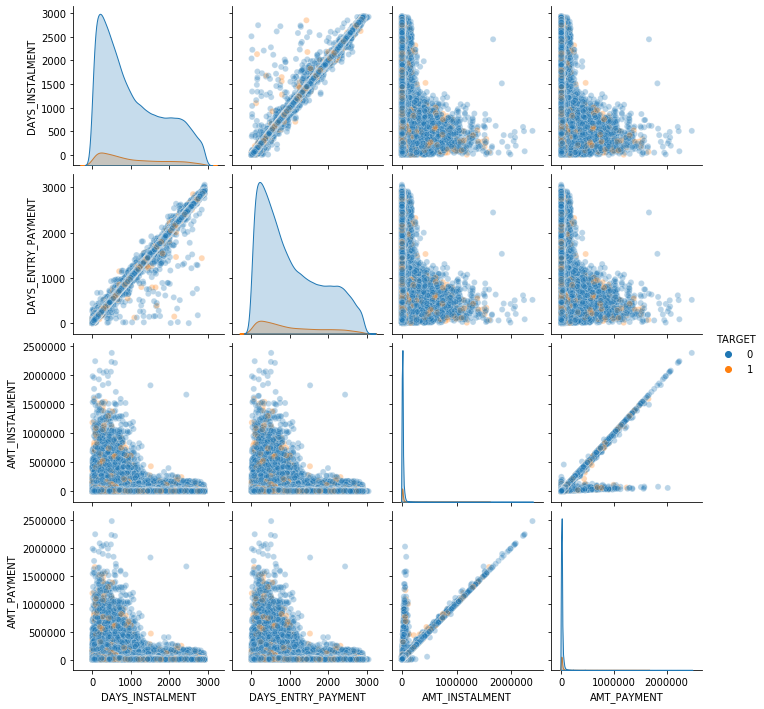

In [19]:
sns.pairplot(my_train2[['TARGET','DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT']], hue='TARGET',  plot_kws = {'alpha': 0.3})

In [20]:
my_train2['TARGET'].value_counts()

0    317389
1     27676
Name: TARGET, dtype: int64

In [21]:
disbalance = my_train2['TARGET'].value_counts().values[0] / my_train2['TARGET'].value_counts().values[1]
disbalance

11.468022835669894

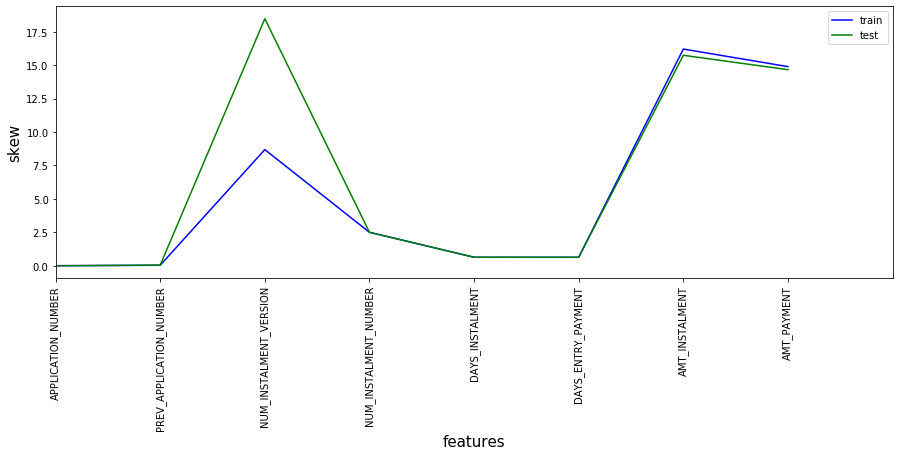

In [22]:
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train2.drop('TARGET', axis=1).skew(), my_test2.skew()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.xlim(0, len(train_stats))
plt.ylabel("skew", size=15)
plt.legend()
plt.show()

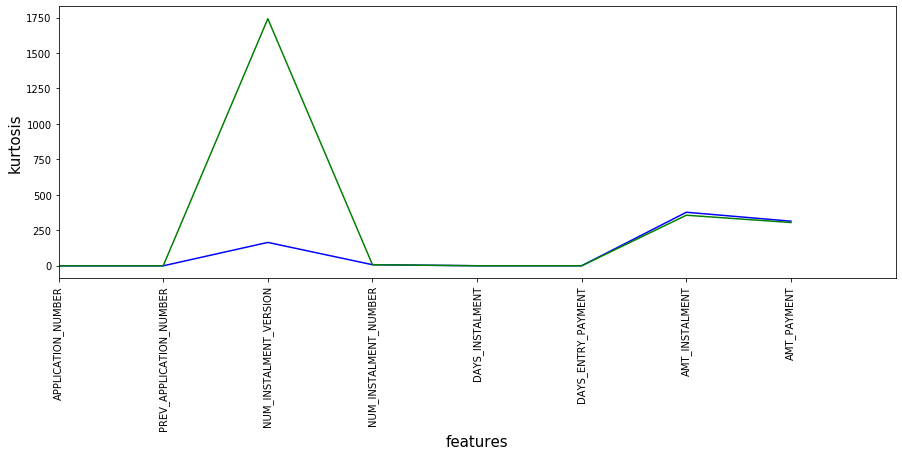

In [23]:
# Куртосис
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train2.drop('TARGET', axis=1).kurtosis(), my_test2.kurtosis()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.ylabel("kurtosis", size=15)
plt.xlim(0, len(train_stats))
plt.show()

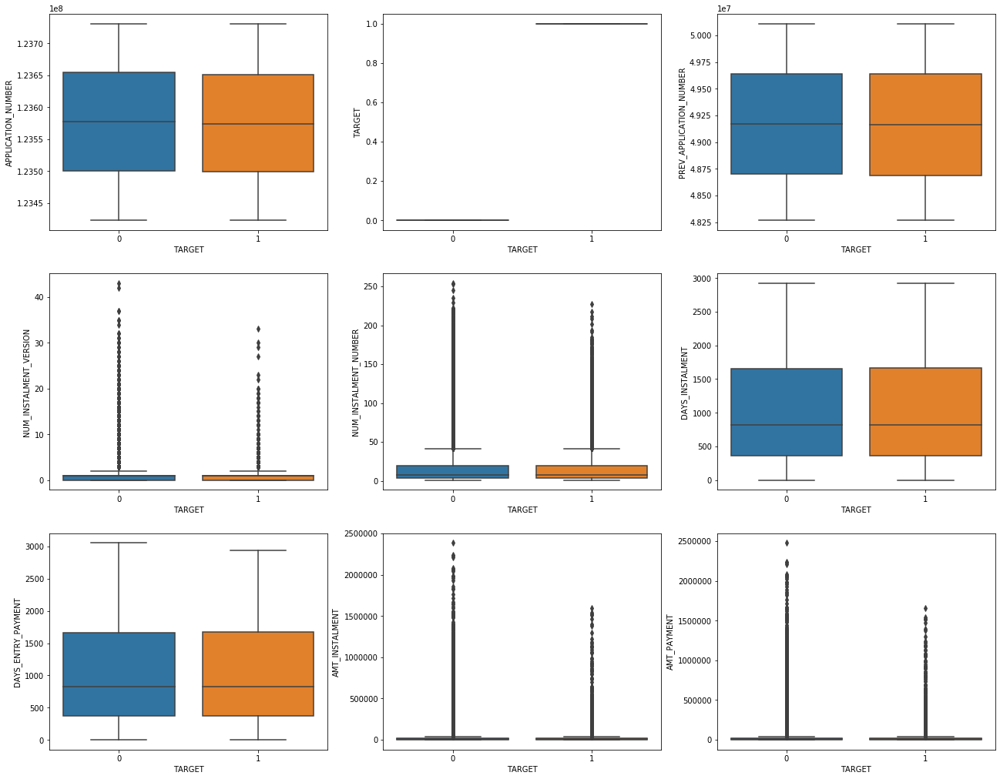

In [25]:
plt.figure(figsize = (22, 30))
for num, feature in enumerate(my_train2.select_dtypes(exclude=['object', 'category']).columns.tolist(), start=1):
    plt.subplot(5, 3, num)
    sns.boxplot(x=my_train2['TARGET'], y=feature, data=my_train2)

In [28]:
features_to_score2 = my_train2.drop('TARGET', axis=1).select_dtypes(exclude=['object', 'category']).columns.tolist()
psi2 = PSI(threshold=0.01)

In [29]:
psi2.fit_transform(
    X=my_train2[features_to_score2],
    y=my_test2[features_to_score2]
)

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.59it/s]


,Variable,PSI,Selected
0,NUM_INSTALMENT_VERSION,0.000006,1
1,NUM_INSTALMENT_NUMBER,0.000066,1
2,DAYS_ENTRY_PAYMENT,0.000075,1
3,DAYS_INSTALMENT,0.000096,1
4,AMT_INSTALMENT,0.000217,1
5,PREV_APPLICATION_NUMBER,0.000261,1
6,AMT_PAYMENT,0.000280,1
7,APPLICATION_NUMBER,0.000549,1


In [30]:
X_adv2 = pd.concat([
    my_train2[features_to_score2], my_test2[features_to_score2]
])
y_adv2 = np.hstack(
    (np.ones(my_train2.shape[0]), np.zeros(my_test2.shape[0])))

X_adv2 = X_adv2.reset_index(drop=True)

In [31]:
%%time
parameters = {"max_depth": 4, "n_estimators": 50, "random_state": 27, "n_jobs": 2}
model2 = xgb.XGBClassifier(**parameters)

cv = cross_val_score(
    estimator=model2,
    X=X_adv2, y=y_adv2,
    scoring="roc_auc",
    cv=KFold(n_splits=3, shuffle=True, random_state=27)
)
print(f"CV-score: {round(np.mean(cv), 4)}")

[18:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[18:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[18:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
CV-score: 0.5251
Wall time: 1min


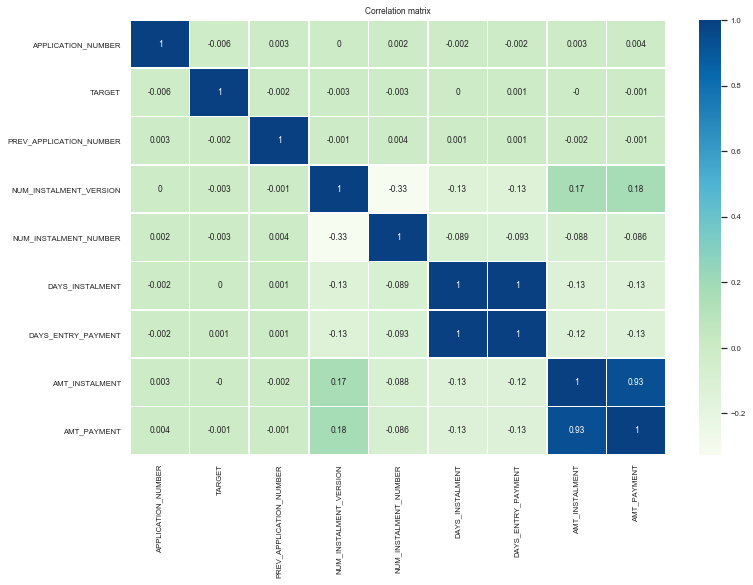

In [34]:
plt.figure(figsize = (12,8))
sns.set(font_scale=0.7)
sns.heatmap( my_train2.corr().round(3), annot=True, linewidths=.5, cmap='GnBu')
plt.title('Correlation matrix')
plt.show()

In [27]:
for ii in my_train2.select_dtypes(include=['object', 'category']).columns.tolist():
    my_train2[ii] = my_train2[ii].astype(str)

In [28]:
# parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}

cat_features_idx2 = np.where(my_train2.drop(['TARGET'], axis=1).dtypes == 'object')[0].tolist()

ctb2 = CatBoostClassifier(**params)
ctb2.fit(my_train2.drop(['TARGET'], axis=1).fillna(-9999), my_train2['TARGET'], cat_features=cat_features_idx2, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Text(0.5, 1.0, 'What are the top important features to start with?')

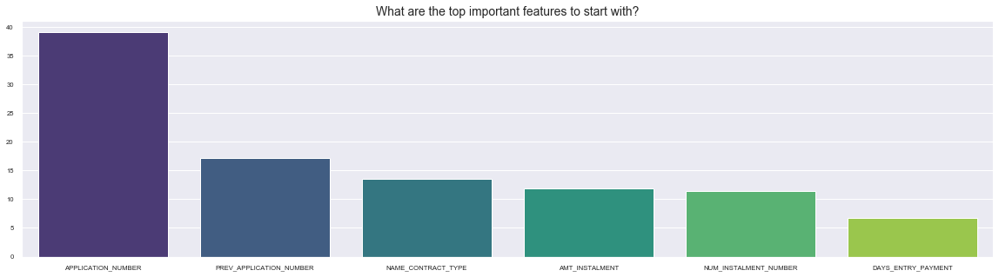

In [71]:
n_top = 20
importances = ctb2.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = my_train2.drop(['TARGET'], axis=1).columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

In [ ]:
# На удаление:
# DAYS_INSTALMENT
# AMT_PAYMENT
# NUM_INSTALMENT_VERSION

In [43]:
for ii in my_test2.select_dtypes(include=['object', 'category']).columns.tolist():
    my_test2[ii] = my_test2[ii].astype(str)
    
predict2 = ctb2.predict_proba(my_test2)

my_test2['pred2'] = predict2[:,1].tolist()

drop_in_index_test2 = my_test2.loc[my_test2['APPLICATION_NUMBER'].duplicated()].index
my_test2 = my_test2.drop(index=drop_in_index_test2, axis=0)
my_test2

,APPLICATION_NUMBER,NAME_CONTRACT_TYPE,PREV_APPLICATION_NUMBER,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,pred,pred2
0,123724268,Cash,48498761.0,1.0,6.0,539.0,549.0,11175.615234,11175.615234,0.069272,0.069272
2,123456549,Cash,49786843.0,1.0,3.0,300.0,299.0,47870.773438,47870.773438,0.104290,0.104290
4,123428178,Credit Card,49448443.0,1.0,16.0,556.0,555.0,49626.000000,49626.000000,0.032759,0.032759
5,123619984,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.081066,0.081066
6,123671104,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.077156,0.077156
...,...,...,...,...,...,...,...,...,...,...,...
515962,123487967,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.059235,0.059235
515963,123536402,Cash,49931333.0,1.0,6.0,223.0,231.0,24301.935547,24301.935547,0.076516,0.076516
515965,123718238,Cash,49098920.0,0.0,87.0,735.0,735.0,312.795013,312.795013,0.092306,0.092306
515985,123631557,Cash,48812626.0,1.0,10.0,891.0,895.0,16762.904297,16762.904297,0.098038,0.098038


In [ ]:
# Дополнительно рассмотрим еще несколько моментов

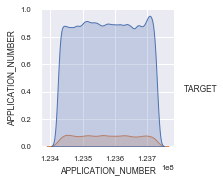

In [44]:
sns.pairplot(my_train2[['TARGET', 'APPLICATION_NUMBER']], hue='TARGET',  plot_kws = {'alpha': 0.3})

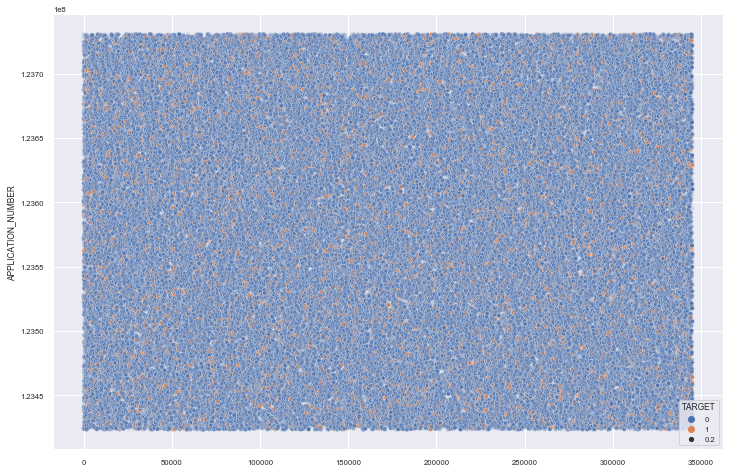

In [53]:
plt.figure(figsize = (12,8))
sns.scatterplot(range(len(my_train2['APPLICATION_NUMBER'])), my_train2['APPLICATION_NUMBER'], size=0.2, alpha=0.2, hue=my_train2['TARGET'])

In [57]:
my_train2.loc[(my_train2['DAYS_INSTALMENT'].isna()) & (my_train2['TARGET'] == 0)]['APPLICATION_NUMBER']

14        123718821
43        123728314
44        123525176
53        123649339
92        123444857
            ...    
345018    123450259
345030    123525515
345031    123457895
345032    123708679
345062    123554358
Name: APPLICATION_NUMBER, Length: 25875, dtype: int32

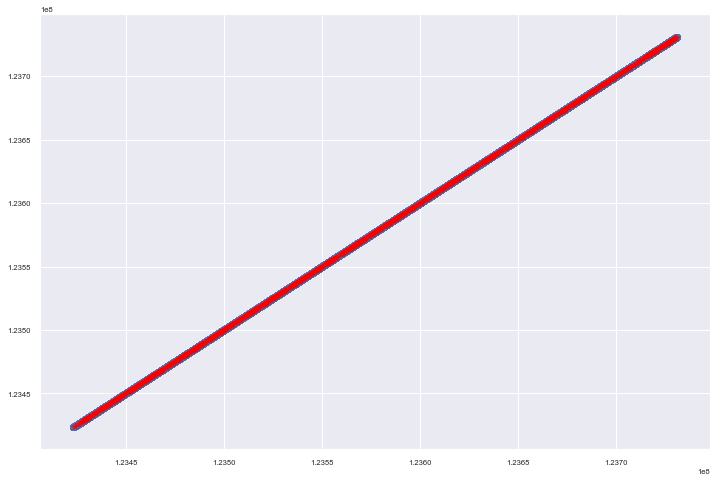

In [69]:
plt.figure(figsize = (12,8))
plt.scatter(my_train2.loc[(my_train2['DAYS_INSTALMENT'].isna()) & (my_train2['TARGET'] == 0)]['APPLICATION_NUMBER'],
         my_train2.loc[(my_train2['DAYS_INSTALMENT'].isna()) & (my_train2['TARGET'] == 0)]['APPLICATION_NUMBER'])

plt.scatter(my_train2.loc[(my_train2['DAYS_INSTALMENT'].isna()) & (my_train2['TARGET'] == 1)]['APPLICATION_NUMBER'],
         my_train2.loc[(my_train2['DAYS_INSTALMENT'].isna()) & (my_train2['TARGET'] == 1)]['APPLICATION_NUMBER'], marker='*', alpha=0.2, color='red')

### 3. АНАЛИЗ train и bki <a class='anchor' id='train_bki'>

In [37]:
my_train3 = pd.merge(train, bki, on='APPLICATION_NUMBER', how='left')
my_test3 = pd.merge(test, bki, on='APPLICATION_NUMBER', how='left')

In [74]:
my_train3

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE,BUREAU_ID,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,123687442,0,Cash,5640206.0,Closed,currency 1,2562.0,0.0,2197.0,2162.0,4714.424805,0.0,5.636250e+04,0.0,0.0,0.0,Consumer credit,2162.0,NaN
1,123597908,1,Cash,5970760.0,Closed,currency 1,1809.0,0.0,1475.0,1503.0,NaN,0.0,5.637600e+04,0.0,NaN,0.0,Consumer credit,731.0,NaN
2,123597908,1,Cash,5923029.0,Closed,currency 1,434.0,0.0,130.0,130.0,0.000000,0.0,1.379106e+05,0.0,0.0,0.0,Consumer credit,126.0,NaN
3,123597908,1,Cash,5952522.0,Active,currency 1,141.0,0.0,225.0,NaN,NaN,0.0,2.640105e+05,181561.5,0.0,0.0,Consumer credit,10.0,NaN
4,123597908,1,Cash,5912683.0,Closed,currency 1,1213.0,0.0,86.0,98.0,NaN,0.0,2.946150e+05,0.0,NaN,0.0,Consumer credit,83.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317267,123554358,0,Cash,6773984.0,Closed,currency 1,620.0,0.0,71.0,71.0,NaN,0.0,4.500000e+05,0.0,NaN,0.0,Consumer credit,58.0,NaN
317268,123554358,0,Cash,6764230.0,Closed,currency 1,2287.0,0.0,2042.0,1998.0,NaN,0.0,9.619200e+04,0.0,0.0,0.0,Consumer credit,1994.0,NaN
317269,123554358,0,Cash,6750483.0,Closed,currency 1,683.0,0.0,316.0,316.0,0.000000,0.0,8.293365e+04,0.0,0.0,0.0,Consumer credit,310.0,NaN
317270,123676265,0,Credit Card,6423033.0,Active,currency 1,44.0,0.0,687.0,NaN,NaN,0.0,1.395000e+06,1395000.0,0.0,0.0,Consumer credit,40.0,NaN


In [76]:
my_train3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 317272 entries, 0 to 317271
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype   
---  ------                  --------------   -----   
 0   APPLICATION_NUMBER      317272 non-null  int32   
 1   TARGET                  317272 non-null  int8    
 2   NAME_CONTRACT_TYPE      317272 non-null  category
 3   BUREAU_ID               291687 non-null  float64 
 4   CREDIT_ACTIVE           291687 non-null  category
 5   CREDIT_CURRENCY         291687 non-null  category
 6   DAYS_CREDIT             291687 non-null  float32 
 7   CREDIT_DAY_OVERDUE      291687 non-null  float64 
 8   DAYS_CREDIT_ENDDATE     273545 non-null  float32 
 9   DAYS_ENDDATE_FACT       183696 non-null  float32 
 10  AMT_CREDIT_MAX_OVERDUE  100981 non-null  float32 
 11  CNT_CREDIT_PROLONG      291687 non-null  float64 
 12  AMT_CREDIT_SUM          291685 non-null  float32 
 13  AMT_CREDIT_SUM_DEBT     247958 non-null  float32 
 14  AMT_

In [81]:
my_train3.describe()

,APPLICATION_NUMBER,TARGET,BUREAU_ID,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,3.172720e+05,317272.000000,2.916870e+05,291687.000000,291687.000000,273545.000000,183696.000000,1.009810e+05,291687.000000,2.916850e+05,2.479580e+05,1.911230e+05,2.916870e+05,291687.000000,8.372100e+04
mean,1.235771e+08,0.082172,5.974822e+06,1139.005737,0.804407,1823.262939,1013.464844,3.778120e+03,0.006164,3.580829e+05,1.358095e+05,6.166571e+03,3.367481e+01,591.996765,1.664647e+04
std,8.871829e+04,0.274628,5.320291e+05,794.047974,35.879891,4699.156250,712.355225,8.680053e+04,0.092188,1.258972e+06,6.287919e+05,4.258066e+04,3.853333e+03,742.906433,3.193003e+05
min,1.234233e+08,0.000000,5.001547e+06,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,-1.081918e+06,-2.231230e+05,0.000000e+00,0.000000,0.000000e+00
25%,1.235002e+08,0.000000,5.514190e+06,473.000000,0.000000,379.000000,422.000000,0.000000e+00,0.000000,5.122350e+04,0.000000e+00,0.000000e+00,0.000000e+00,33.000000,0.000000e+00
50%,1.235768e+08,0.000000,5.977416e+06,984.000000,0.000000,861.000000,891.000000,0.000000e+00,0.000000,1.255500e+05,0.000000e+00,0.000000e+00,0.000000e+00,391.000000,0.000000e+00
75%,1.236537e+08,0.000000,6.435142e+06,1660.000000,0.000000,1500.000000,1483.000000,0.000000e+00,0.000000,3.150000e+05,4.003538e+04,0.000000e+00,0.000000e+00,905.000000,1.350000e+04
max,1.237308e+08,1.000000,6.942186e+06,2922.000000,2792.000000,42041.000000,2916.000000,1.397526e+07,7.000000,3.960000e+08,4.496838e+07,2.700000e+06,1.097438e+06,41931.000000,5.747623e+07


In [94]:
my_train3.APPLICATION_NUMBER.duplicated().sum()

207179

In [87]:
my_train3['AMT_CREDIT_MAX_OVERDUE'].quantile(0.99)

42745.03

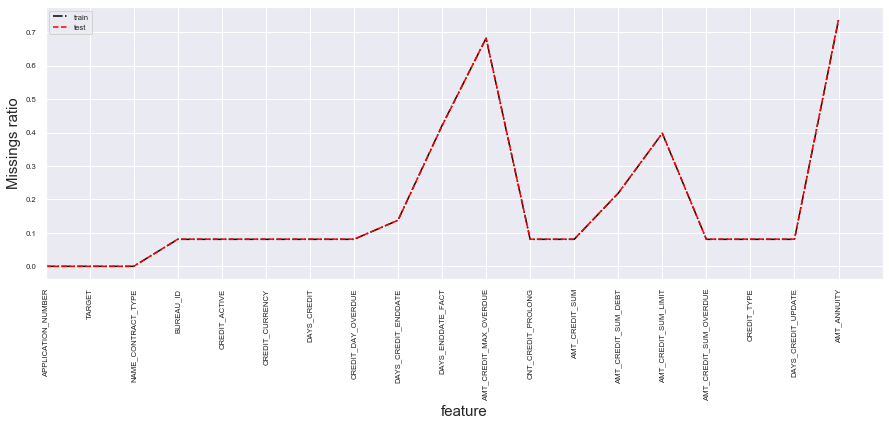

In [95]:
fig = plt.figure(figsize=(15, 5))
plt.plot(my_train3.isnull().mean(), label="train", color="black", linestyle='-.')
plt.plot(my_test3.isnull().mean(), label="test", color="red", linestyle='--')
plt.xticks(range(my_train3.shape[1]), my_train3.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, my_train3.shape[1])
plt.legend(loc="best")

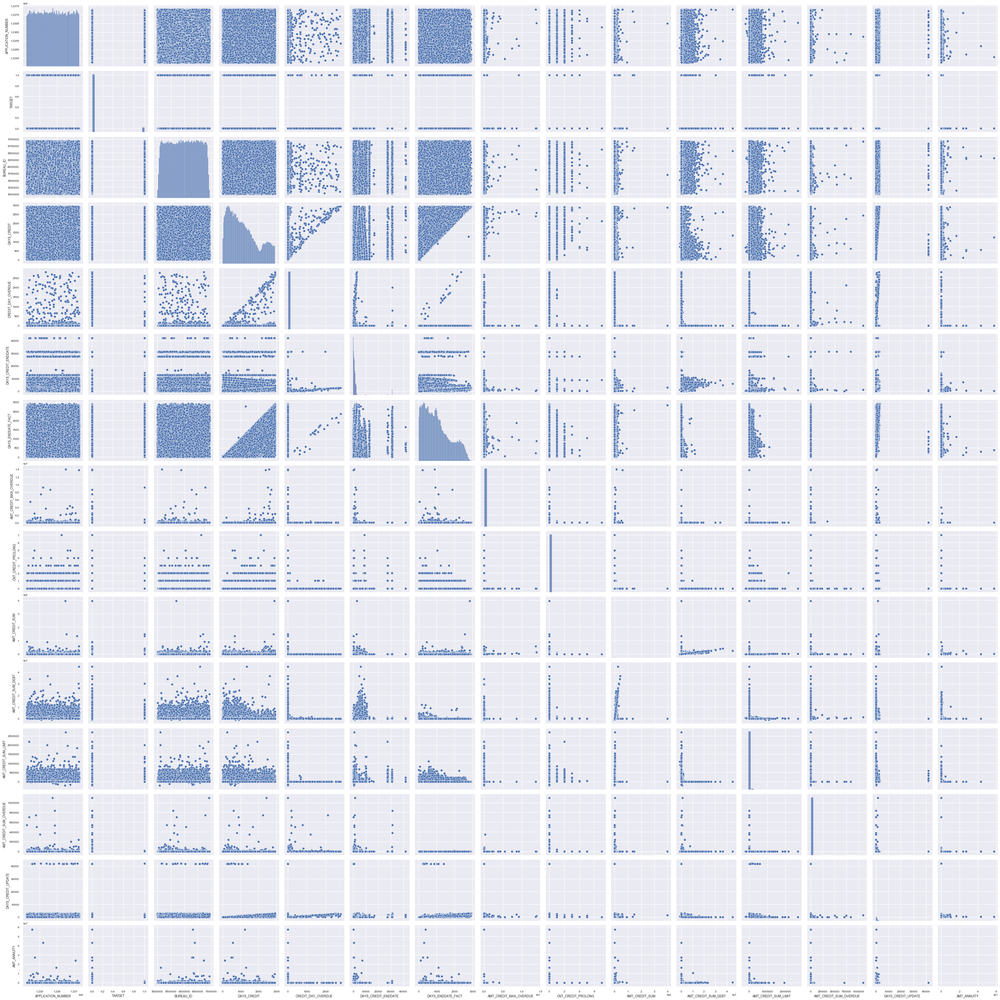

In [96]:
sns.pairplot(my_train3)

In [97]:
my_train3.columns

Index(['APPLICATION_NUMBER', 'TARGET', 'NAME_CONTRACT_TYPE', 'BUREAU_ID',
       'CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE',
       'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY'],
      dtype='object')

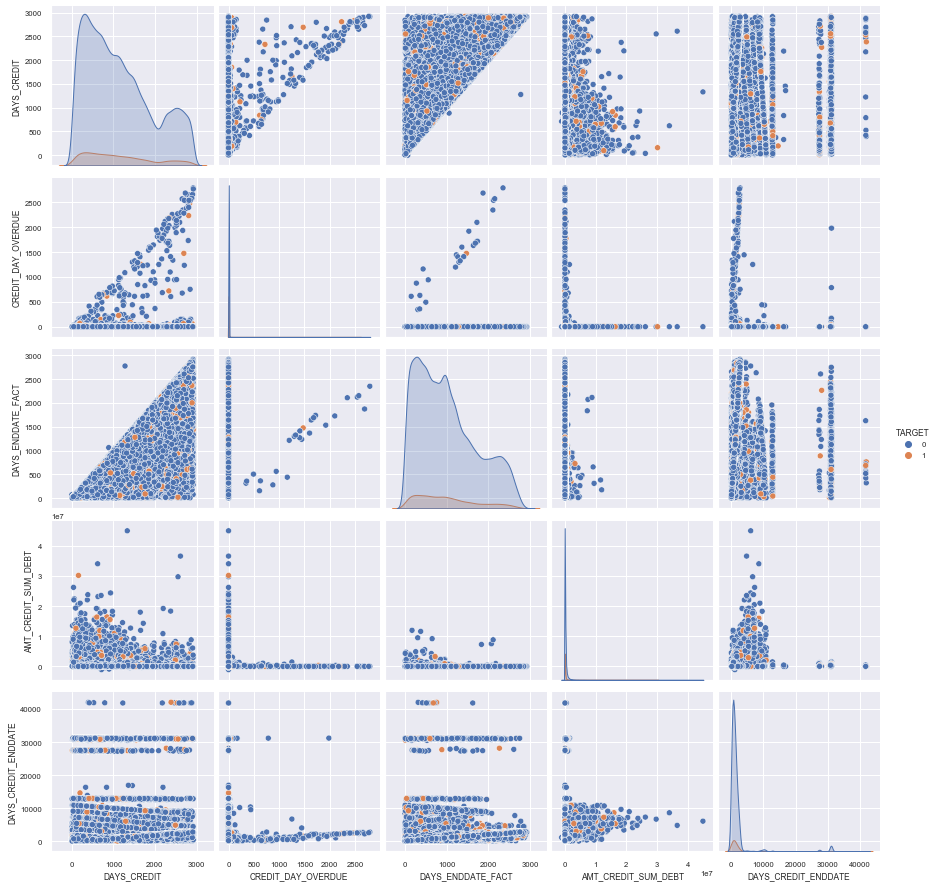

In [110]:
sns.pairplot(my_train3[['TARGET',
                        'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_ENDDATE_FACT', 
                        'AMT_CREDIT_SUM_DEBT', 'DAYS_CREDIT_ENDDATE']], hue='TARGET',  plot_kws = {'alpha': 0.99})

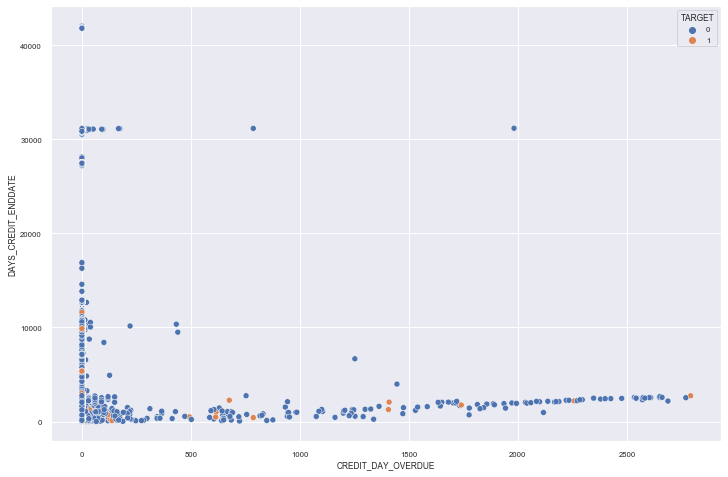

In [109]:
plt.figure(figsize = (12, 8))
# plt.subplot(221)
sns.scatterplot(my_train3['CREDIT_DAY_OVERDUE'], my_train3['DAYS_CREDIT_ENDDATE'], #size=0.5,
                alpha=0.99, hue=my_train2['TARGET'])

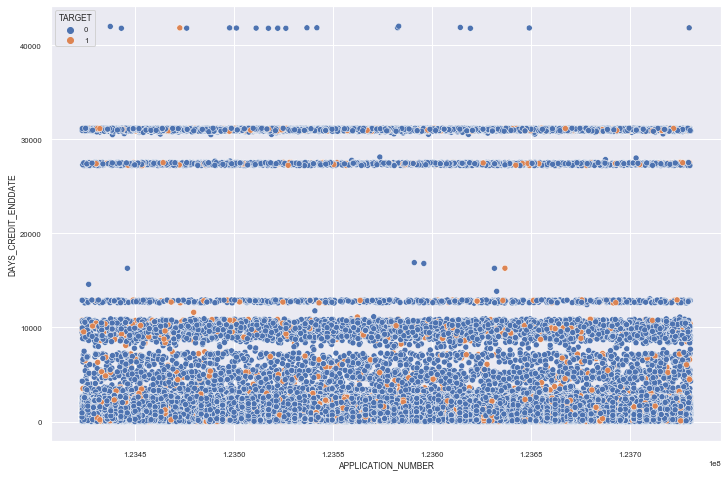

In [108]:
plt.figure(figsize = (12, 8))
# plt.subplot(221)
sns.scatterplot(my_train3['APPLICATION_NUMBER'], my_train3['DAYS_CREDIT_ENDDATE'], #size=0.5,
                alpha=0.99, hue=my_train2['TARGET'])

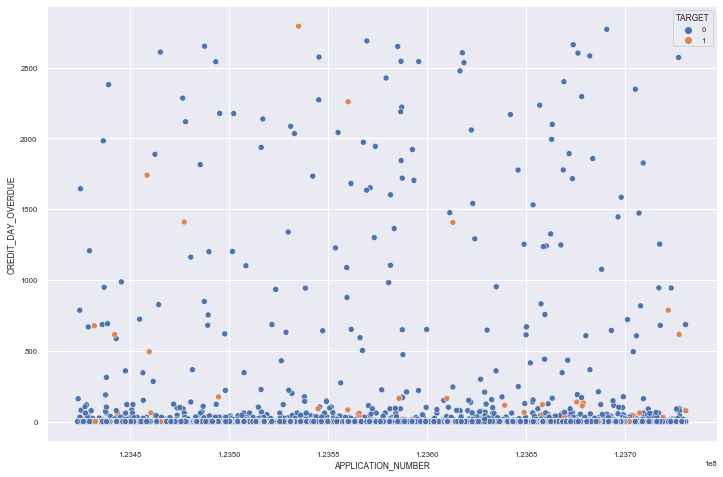

In [107]:
plt.figure(figsize = (12, 8))
# plt.subplot(221)
sns.scatterplot(my_train3['APPLICATION_NUMBER'], my_train3['CREDIT_DAY_OVERDUE'], #size=0.5,
                alpha=0.99, hue=my_train2['TARGET'])

In [111]:
my_train3['TARGET'].value_counts()

0    291201
1     26071
Name: TARGET, dtype: int64

In [112]:
disbalance = my_train3['TARGET'].value_counts().values[0] / my_train3['TARGET'].value_counts().values[1]
disbalance

11.169537033485481

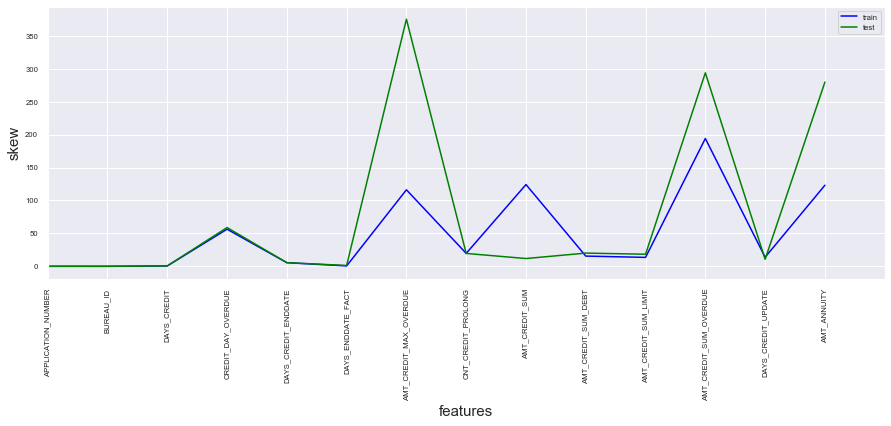

In [113]:
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train3.drop('TARGET', axis=1).skew(), my_test3.skew()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.xlim(0, len(train_stats))
plt.ylabel("skew", size=15)
plt.legend()
plt.show()

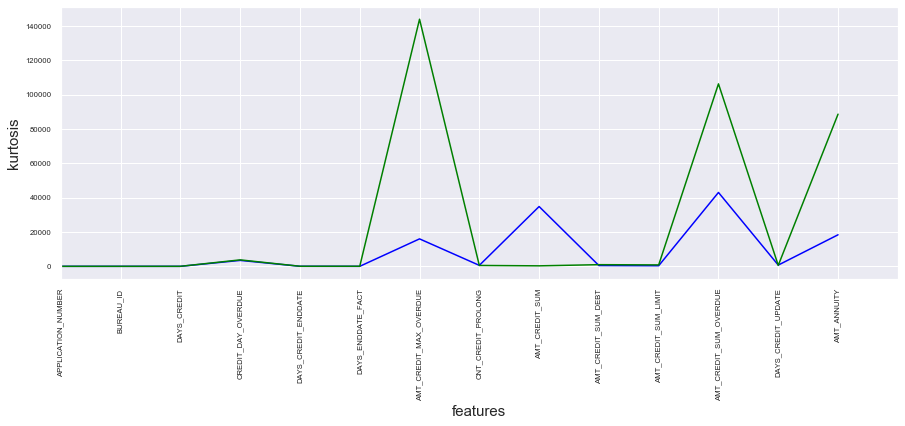

In [114]:
# Куртосис
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train3.drop('TARGET', axis=1).kurtosis(), my_test3.kurtosis()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.ylabel("kurtosis", size=15)
plt.xlim(0, len(train_stats))
plt.show()

In [ ]:
# На удаление:
# 'CREDIT_TYPE'
# 'CNT_CREDIT_PROLONG'
# 'CREDIT_CURRENCY'
# 'AMT_CREDIT_SUM_LIMIT'
# 'AMT_CREDIT_SUM_OVERDUE'
# 'DAYS_ENDDATE_FACT'
# 'CREDIT_DAY_OVERDUE'
# 'AMT_CREDIT_MAX_OVERDUE'
# 'AMT_CREDIT_SUM_DEBT'

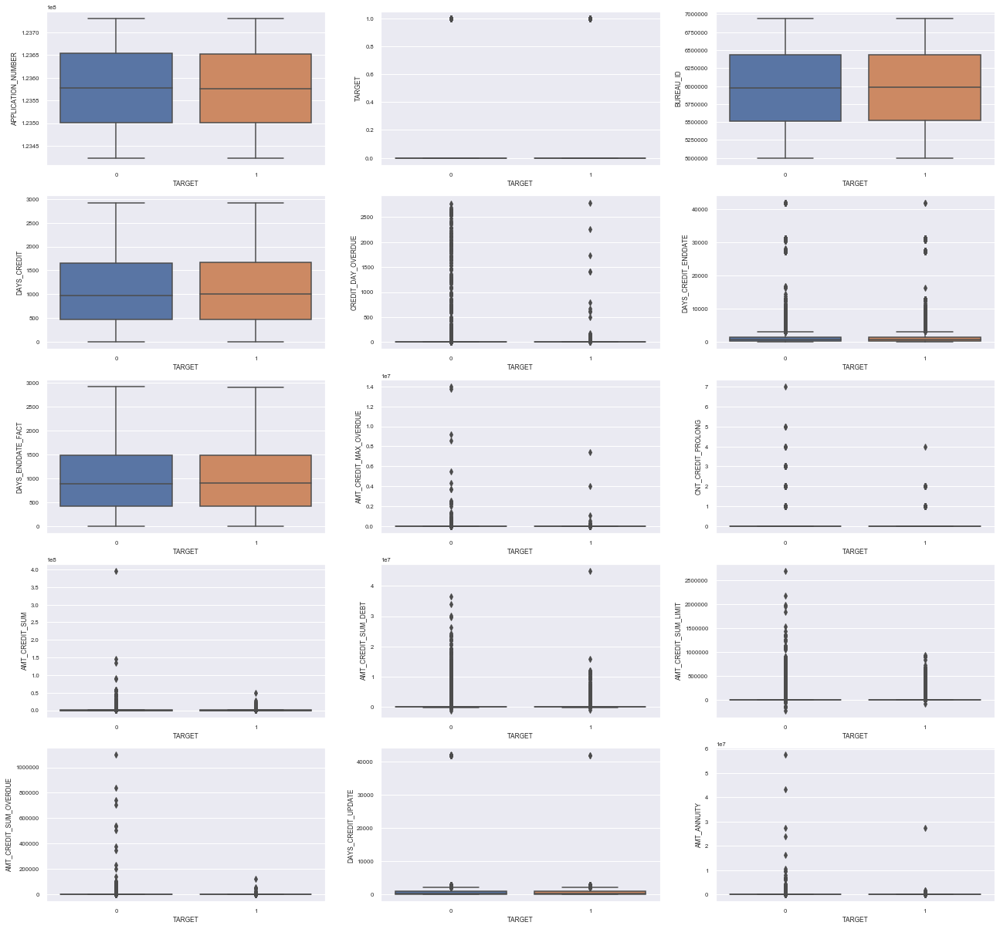

In [116]:
plt.figure(figsize = (22, 30))
for num, feature in enumerate(my_train3.select_dtypes(exclude=['object', 'category']).columns.tolist(), start=1):
    plt.subplot(7, 3, num)
    sns.boxplot(x=my_train2['TARGET'], y=feature, data=my_train3)

In [117]:
features_to_score3 = my_train3.drop('TARGET', axis=1).select_dtypes(exclude=['object', 'category']).columns.tolist()
psi3 = PSI(threshold=0.01)

In [119]:
psi3.fit_transform(
    X=my_train3[features_to_score3],
    y=my_test3[features_to_score3]
)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


,Variable,PSI,Selected
0,CREDIT_DAY_OVERDUE,3.178822e-07,1
1,CNT_CREDIT_PROLONG,3.178822e-07,1
2,AMT_CREDIT_SUM_OVERDUE,3.253338e-07,1
3,AMT_CREDIT_SUM_LIMIT,1.969674e-06,1
4,AMT_CREDIT_MAX_OVERDUE,5.265438e-05,1
5,AMT_CREDIT_SUM_DEBT,7.810967e-05,1
6,AMT_CREDIT_SUM,1.070331e-04,1
7,AMT_ANNUITY,1.148035e-04,1
8,DAYS_CREDIT_UPDATE,1.170302e-04,1
9,DAYS_CREDIT,1.520214e-04,1


In [121]:
X_adv3 = pd.concat([
    my_train3[features_to_score3], my_test3[features_to_score3]
])
y_adv3 = np.hstack(
    (np.ones(my_train3.shape[0]), np.zeros(my_test3.shape[0])))

X_adv3 = X_adv3.reset_index(drop=True)

In [122]:
%%time
parameters = {"max_depth": 4, "n_estimators": 50, "random_state": 27, "n_jobs": 2}
model3 = xgb.XGBClassifier(**parameters)

cv = cross_val_score(
    estimator=model3,
    X=X_adv3, y=y_adv3,
    scoring="roc_auc",
    cv=KFold(n_splits=3, shuffle=True, random_state=27)
)
print(f"CV-score: {round(np.mean(cv), 4)}")

[21:42:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:43:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
CV-score: 0.5163
Wall time: 58.8 s


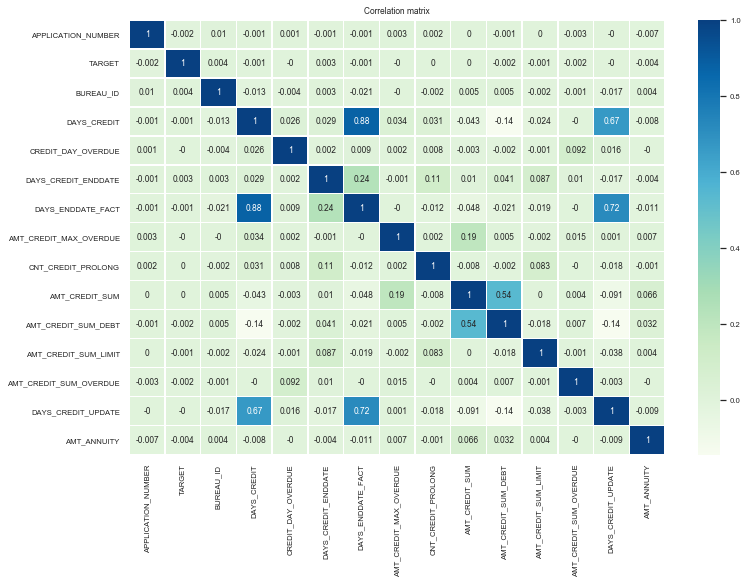

In [123]:
plt.figure(figsize = (12,8))
sns.set(font_scale=0.7)
sns.heatmap( my_train3.corr().round(3), annot=True, linewidths=.5, cmap='GnBu')
plt.title('Correlation matrix')
plt.show()

In [39]:
for ii in my_train3.select_dtypes(include=['object', 'category']).columns.tolist():
    my_train3[ii] = my_train3[ii].astype(str)

In [40]:
# parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}
cat_features_idx3 = np.where(my_train3.drop(['TARGET'], axis=1).dtypes == 'object')[0].tolist()

ctb3 = CatBoostClassifier(**params)
ctb3.fit(my_train3.drop(['TARGET'], axis=1).fillna(-9999), my_train3['TARGET'], cat_features=cat_features_idx3, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Text(0.5, 1.0, 'What are the top important features to start with?')

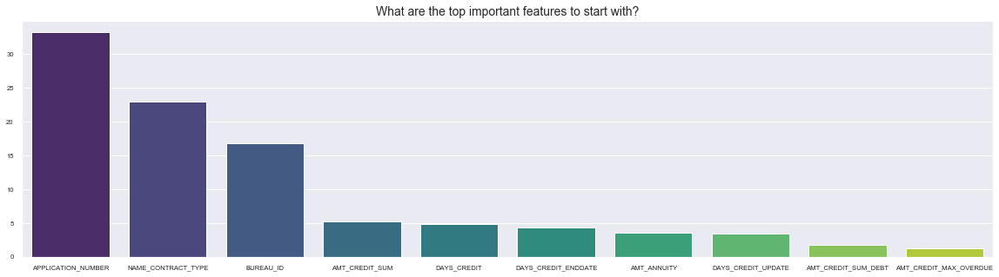

In [139]:
n_top = 10
importances = ctb3.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = my_train3.drop(['TARGET'], axis=1).columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

In [ ]:
# На удаление:
# 'CREDIT_TYPE'
# 'CNT_CREDIT_PROLONG'
# 'CREDIT_CURRENCY'
# 'AMT_CREDIT_SUM_LIMIT'
# 'AMT_CREDIT_SUM_OVERDUE'
# 'DAYS_ENDDATE_FACT'
# 'CREDIT_DAY_OVERDUE'
# 'AMT_CREDIT_MAX_OVERDUE'
# 'AMT_CREDIT_SUM_DEBT'


In [42]:
for ii in my_test3.select_dtypes(include=['object', 'category']).columns.tolist():
    my_test3[ii] = my_test3[ii].astype(str)
    
predict3 = ctb3.predict_proba(my_test3)

my_test3['pred3'] = predict3[:,1].tolist()

drop_in_index_test3 = my_test3.loc[my_test3['APPLICATION_NUMBER'].duplicated()].index
my_test3 = my_test3.drop(index=drop_in_index_test3, axis=0)
my_test3

,APPLICATION_NUMBER,NAME_CONTRACT_TYPE,BUREAU_ID,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,pred,pred3
0,123724268,Cash,6181931.0,Closed,currency 1,744.0,0.0,14.0,14.0,NaN,0.0,4.545000e+05,0.0,NaN,0.0,Consumer credit,11.0,NaN,0.079042,0.079042
1,123456549,Cash,5470136.0,Closed,currency 1,2419.0,0.0,2206.0,2234.0,6538.455078,0.0,3.247029e+04,0.0,0.0,0.0,Consumer credit,2234.0,NaN,0.099485,0.099485
3,123428178,Credit Card,6692890.0,Closed,currency 1,532.0,0.0,30899.0,239.0,NaN,0.0,0.000000e+00,0.0,0.0,0.0,Credit card,209.0,0.0,0.100954,0.100954
9,123619984,Cash,5350996.0,Active,currency 1,210.0,0.0,3442.0,NaN,NaN,0.0,8.100000e+05,202.5,0.0,0.0,Credit card,13.0,NaN,0.095572,0.095572
11,123671104,Cash,5546222.0,Closed,currency 1,937.0,0.0,889.0,114.0,NaN,0.0,2.025000e+06,0.0,0.0,0.0,Consumer credit,107.0,0.0,0.084768,0.084768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
476356,123487967,Cash,NaN,nan,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan,NaN,NaN,0.110190,0.110190
476357,123536402,Cash,NaN,nan,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan,NaN,NaN,0.101064,0.101064
476358,123718238,Cash,5370810.0,Active,currency 1,471.0,0.0,1355.0,NaN,NaN,0.0,6.750000e+05,568989.0,0.0,0.0,Consumer credit,38.0,NaN,0.109423,0.109423
476360,123631557,Cash,5911753.0,Closed,currency 1,540.0,0.0,397.0,397.0,NaN,0.0,6.750000e+04,0.0,NaN,0.0,Credit card,390.0,NaN,0.062709,0.062709


### 4. АНАЛИЗ train и applications_history  <a class='anchor' id='train_app_hist'>

In [44]:
my_train4 = pd.merge(train, applications_history, on='APPLICATION_NUMBER', how='left')
my_test4 = pd.merge(test, applications_history, on='APPLICATION_NUMBER', how='left')

In [142]:
my_train4

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE_x,PREV_APPLICATION_NUMBER,NAME_CONTRACT_TYPE_y,AMOUNT_ANNUITY,AMT_APPLICATION,AMOUNT_CREDIT,AMOUNT_PAYMENT,AMOUNT_GOODS_PAYMENT,...,NAME_PRODUCT_TYPE,SELLERPLACE_AREA,CNT_PAYMENT,NAME_YIELD_GROUP,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,123687442,0,Cash,49915814.0,NaN,6510.015137,71668.796875,64500.300781,7168.500000,71668.796875,...,XNA,20.0,12.0,middle,365243.0,143.0,187.0,365243.0,365243.0,0.0
1,123687442,0,Cash,49713743.0,NaN,9262.214844,72634.140625,70758.000000,7267.140137,72634.140625,...,XNA,90.0,10.0,high,365243.0,2671.0,2401.0,2401.0,2368.0,1.0
2,123687442,0,Cash,49704707.0,NaN,7339.185059,62058.601562,67518.000000,3.600000,62058.601562,...,XNA,150.0,10.0,low_action,365243.0,690.0,420.0,420.0,415.0,0.0
3,123597908,1,Cash,48716994.0,Cash,38667.601562,495000.000000,672948.000000,NaN,495000.000000,...,x-sell,-1.0,36.0,high,NaN,NaN,NaN,NaN,NaN,NaN
4,123597908,1,Cash,49672074.0,NaN,11349.900391,75510.000000,82156.500000,0.000000,75510.000000,...,XNA,12.0,10.0,high,365243.0,690.0,420.0,420.0,413.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521547,123723001,0,Cash,49650758.0,NaN,4998.645020,34245.000000,27207.000000,8563.500000,34245.000000,...,XNA,156.0,6.0,low_normal,365243.0,160.0,10.0,40.0,34.0,1.0
521548,123723001,0,Cash,49065356.0,NaN,3001.949951,26482.500000,29281.500000,0.000000,26482.500000,...,XNA,156.0,12.0,middle,365243.0,708.0,378.0,558.0,526.0,0.0
521549,123554358,0,Cash,49515687.0,NaN,20264.804688,261180.000000,287037.000000,0.000000,261180.000000,...,XNA,100.0,18.0,middle,365243.0,815.0,305.0,305.0,303.0,0.0
521550,123554358,0,Cash,49102720.0,Cash,29256.615234,337500.000000,368685.000000,NaN,337500.000000,...,walk-in,32.0,24.0,high,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
my_train4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 521552 entries, 0 to 521551
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype   
---  ------                     --------------   -----   
 0   APPLICATION_NUMBER         521552 non-null  int32   
 1   TARGET                     521552 non-null  int8    
 2   NAME_CONTRACT_TYPE_x       521552 non-null  category
 3   PREV_APPLICATION_NUMBER    516115 non-null  float64 
 4   NAME_CONTRACT_TYPE_y       290728 non-null  category
 5   AMOUNT_ANNUITY             401214 non-null  float32 
 6   AMT_APPLICATION            516115 non-null  float32 
 7   AMOUNT_CREDIT              516115 non-null  float32 
 8   AMOUNT_PAYMENT             239381 non-null  float32 
 9   AMOUNT_GOODS_PAYMENT       397320 non-null  float32 
 10  NAME_CONTRACT_STATUS       516115 non-null  category
 11  DAYS_DECISION              516115 non-null  float64 
 12  NAME_PAYMENT_TYPE          516115 non-null  category
 13  CODE_REJECT_RE

In [144]:
my_train4.describe()

,APPLICATION_NUMBER,TARGET,PREV_APPLICATION_NUMBER,AMOUNT_ANNUITY,AMT_APPLICATION,AMOUNT_CREDIT,AMOUNT_PAYMENT,AMOUNT_GOODS_PAYMENT,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,5.215520e+05,521552.000000,5.161150e+05,401214.000000,5.161150e+05,5.161150e+05,2.393810e+05,3.973200e+05,516115.000000,5.161150e+05,401215.000000,308208.000000,308208.000000,308208.000000,308208.000000,308208.000000,308208.000000
mean,1.235771e+08,0.081001,4.919134e+07,15997.563477,1.756790e+05,1.966333e+05,6.705243e+03,2.282206e+05,879.140525,3.288607e+02,16.041595,343178.812500,15827.330078,35068.992188,78340.460938,83555.039062,0.333281
std,8.876861e+04,0.272836,5.325832e+05,14831.876953,2.937540e+05,3.195098e+05,2.111281e+04,3.166046e+05,777.772020,9.786649e+03,14.565637,88435.984375,71768.492188,106274.773438,148942.843750,152681.140625,0.471017
min,1.234233e+08,0.000000,4.826822e+07,0.000000,0.000000e+00,0.000000e+00,-4.500000e-01,0.000000e+00,2.000000,-1.000000e+00,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,0.000000
25%,1.235003e+08,0.000000,4.873018e+07,6338.182617,1.889550e+04,2.430000e+04,0.000000e+00,5.106600e+04,281.000000,-1.000000e+00,6.000000,365243.000000,475.000000,257.000000,456.000000,447.000000,0.000000
50%,1.235771e+08,0.000000,4.919266e+07,11250.000000,7.131150e+04,8.085600e+04,1.611000e+03,1.124550e+05,581.000000,3.000000e+00,12.000000,365243.000000,917.000000,739.000000,1153.000000,1168.000000,0.000000
75%,1.236538e+08,0.000000,4.965253e+07,20750.580078,1.814422e+05,2.172411e+05,7.767000e+03,2.340000e+05,1294.000000,8.100000e+01,24.000000,365243.000000,1817.000000,1729.000000,2421.000000,2502.000000,1.000000
max,1.237308e+08,1.000000,5.011360e+07,418058.156250,5.850000e+06,4.509688e+06,2.150100e+06,5.850000e+06,2922.000000,4.000000e+06,84.000000,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


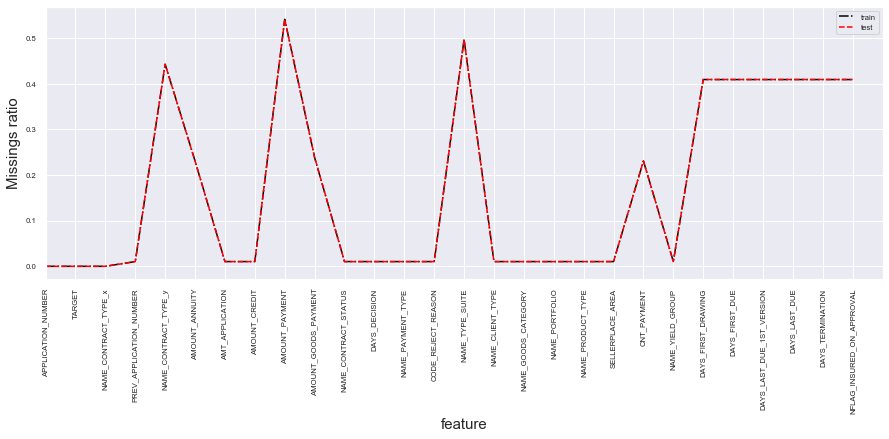

In [145]:
fig = plt.figure(figsize=(15, 5))
plt.plot(my_train4.isnull().mean(), label="train", color="black", linestyle='-.')
plt.plot(my_test4.isnull().mean(), label="test", color="red", linestyle='--')
plt.xticks(range(my_train4.shape[1]), my_train4.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, my_train4.shape[1])
plt.legend(loc="best")

In [147]:
my_train4['TARGET'].value_counts()

0    479306
1     42246
Name: TARGET, dtype: int64

In [148]:
disbalance = my_train4['TARGET'].value_counts().values[0] / my_train4['TARGET'].value_counts().values[1]
disbalance

11.345594849216495

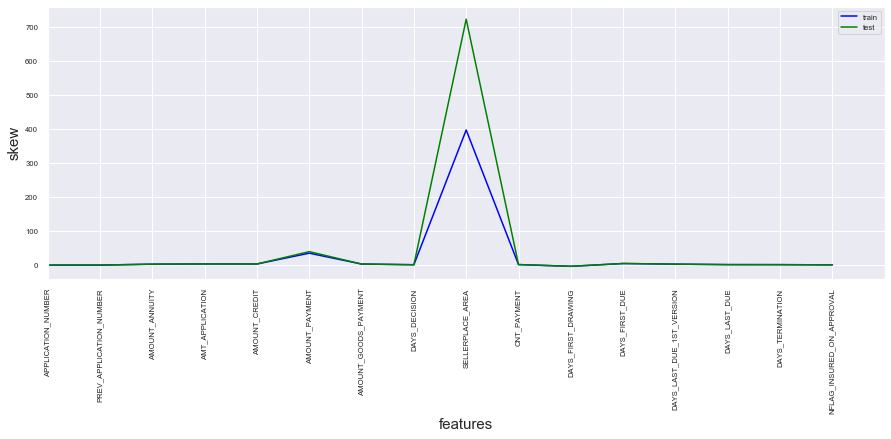

In [149]:
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train4.drop('TARGET', axis=1).skew(), my_test4.skew()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.xlim(0, len(train_stats))
plt.ylabel("skew", size=15)
plt.legend()
plt.show()

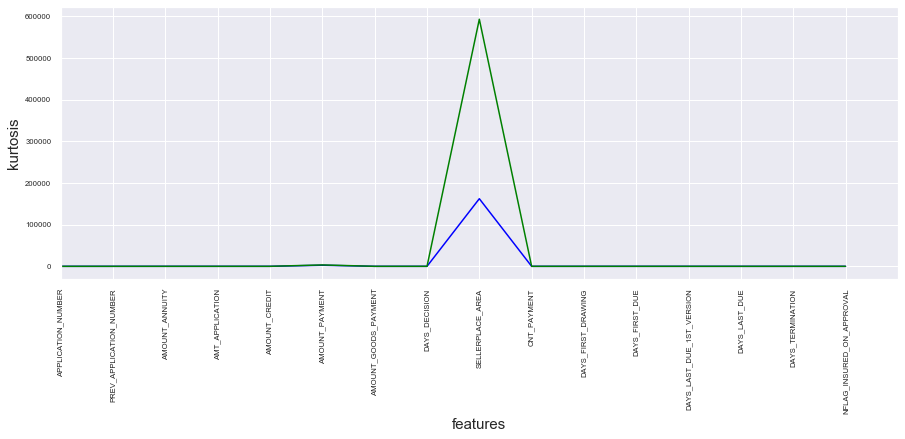

In [150]:
# Куртосис
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = my_train4.drop('TARGET', axis=1).kurtosis(), my_test4.kurtosis()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.ylabel("kurtosis", size=15)
plt.xlim(0, len(train_stats))
plt.show()

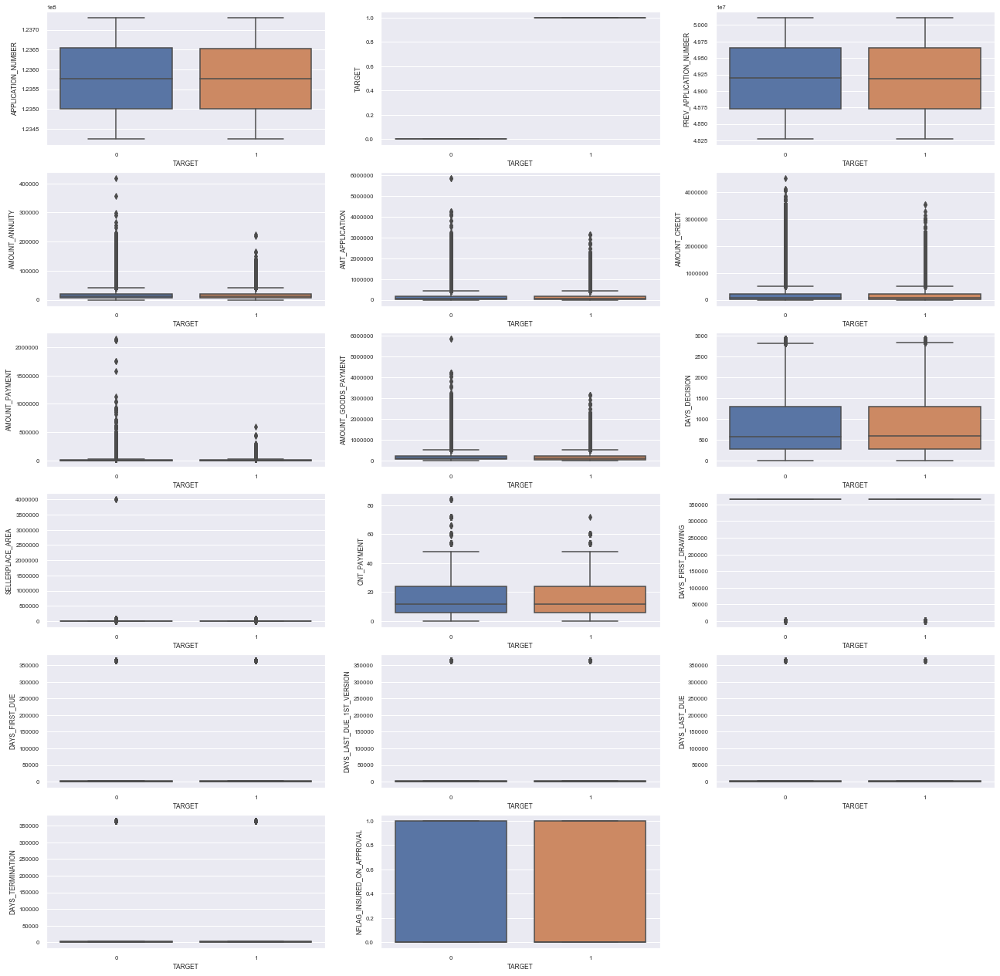

In [151]:
plt.figure(figsize = (22, 30))
for num, feature in enumerate(my_train4.select_dtypes(exclude=['object', 'category']).columns.tolist(), start=1):
    plt.subplot(8, 3, num)
    sns.boxplot(x=my_train4['TARGET'], y=feature, data=my_train4)

In [152]:
features_to_score4 = my_train4.drop('TARGET', axis=1).select_dtypes(exclude=['object', 'category']).columns.tolist()
psi4 = PSI(threshold=0.01)

In [153]:
psi4.fit_transform(
    X=my_train4[features_to_score4],
    y=my_test4[features_to_score4]
)

100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.78it/s]


,Variable,PSI,Selected
0,NFLAG_INSURED_ON_APPROVAL,1.451289e-08,1
1,DAYS_FIRST_DRAWING,3.362244e-07,1
2,DAYS_FIRST_DUE,3.389743e-05,1
3,AMOUNT_CREDIT,3.536428e-05,1
4,SELLERPLACE_AREA,3.887677e-05,1
5,DAYS_TERMINATION,4.020212e-05,1
6,CNT_PAYMENT,4.185528e-05,1
7,DAYS_LAST_DUE,4.572698e-05,1
8,AMT_APPLICATION,5.779352e-05,1
9,PREV_APPLICATION_NUMBER,5.945392e-05,1


In [155]:
X_adv4 = pd.concat([
    my_train4[features_to_score4], my_test4[features_to_score4]
])
y_adv4 = np.hstack(
    (np.ones(my_train4.shape[0]), np.zeros(my_test4.shape[0])))

X_adv4 = X_adv4.reset_index(drop=True)

In [156]:
%%time
parameters = {"max_depth": 4, "n_estimators": 50, "random_state": 27, "n_jobs": 2}
model4 = xgb.XGBClassifier(**parameters)

cv = cross_val_score(
    estimator=model4,
    X=X_adv4, y=y_adv4,
    scoring="roc_auc",
    cv=KFold(n_splits=3, shuffle=True, random_state=27)
)
print(f"CV-score: {round(np.mean(cv), 4)}")

[22:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
CV-score: 0.5217
Wall time: 2min 11s


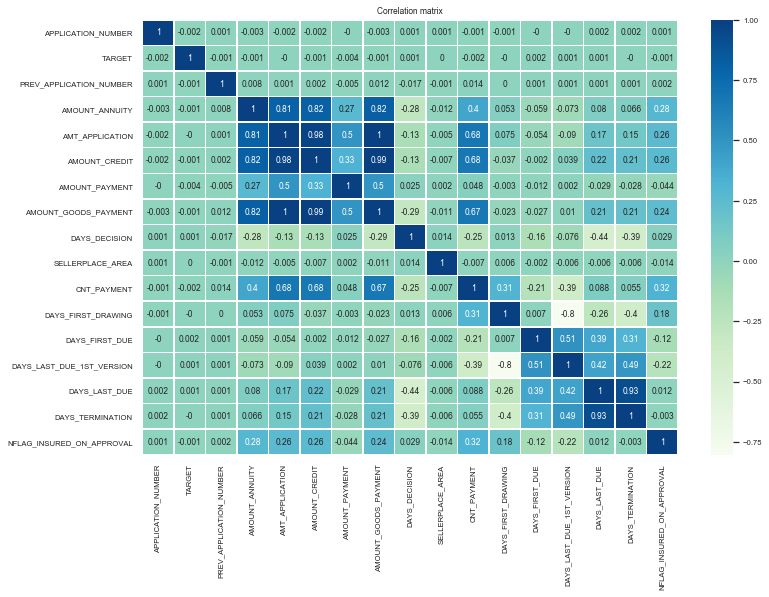

In [157]:
plt.figure(figsize = (12,8))
sns.set(font_scale=0.7)
sns.heatmap( my_train4.corr().round(3), annot=True, linewidths=.5, cmap='GnBu')
plt.title('Correlation matrix')
plt.show()

In [46]:
for ii in my_train4.select_dtypes(include=['object', 'category']).columns.tolist():
    my_train4[ii] = my_train4[ii].astype(str)

In [47]:
# parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}
cat_features_idx4 = np.where(my_train4.drop(['TARGET'], axis=1).dtypes == 'object')[0].tolist()

ctb4 = CatBoostClassifier(**params)
ctb4.fit(my_train4.drop(['TARGET'], axis=1).fillna(-9999), my_train4['TARGET'], cat_features=cat_features_idx4, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Text(0.5, 1.0, 'What are the top important features to start with?')

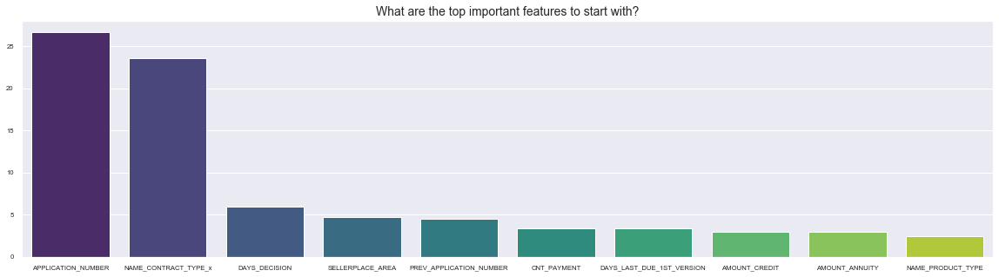

In [174]:
n_top = 10
importances = ctb4.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = my_train4.drop(['TARGET'], axis=1).columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

In [ ]:
# На удаление:
# 'NAME_PRODUCT_TYPE'
# 'NAME_CLIENT_TYPE'
# 'DAYS_FIRST_DRAWING'
# 'NAME_YIELD_GROUP'
# 'DAYS_TERMINATION'
# 'DAYS_FIRST_DUE'
# 'NAME_TYPE_SUITE'
# 'AMT_APPLICATION'
# 'AMOUNT_GOODS_PAYMENT'
# 'NAME_PAYMENT_TYPE'
# 'DAYS_LAST_DUE'
# 'NFLAG_INSURED_ON_APPROVAL'
# 'NAME_CONTRACT_STATUS'
# 'AMOUNT_PAYMENT'
# 'NAME_GOODS_CATEGORY'
# 'NAME_CONTRACT_TYPE_y'
# 'CODE_REJECT_REASON'
# 'NAME_PORTFOLIO'

In [48]:
for ii in my_test4.select_dtypes(include=['object', 'category']).columns.tolist():
    my_test4[ii] = my_test4[ii].astype(str)
    
predict4 = ctb4.predict_proba(my_test4)

my_test4['pred4'] = predict4[:,1].tolist()

drop_in_index_test4 = my_test4.loc[my_test4['APPLICATION_NUMBER'].duplicated()].index
my_test4 = my_test4.drop(index=drop_in_index_test4, axis=0)
my_test4

,APPLICATION_NUMBER,NAME_CONTRACT_TYPE_x,PREV_APPLICATION_NUMBER,NAME_CONTRACT_TYPE_y,AMOUNT_ANNUITY,AMT_APPLICATION,AMOUNT_CREDIT,AMOUNT_PAYMENT,AMOUNT_GOODS_PAYMENT,NAME_CONTRACT_STATUS,...,SELLERPLACE_AREA,CNT_PAYMENT,NAME_YIELD_GROUP,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,pred4
0,123724268,Cash,49492051.0,Credit Card,NaN,0.0,0.0,NaN,NaN,Canceled,...,-1.0,NaN,XNA,NaN,NaN,NaN,NaN,NaN,NaN,0.104841
4,123456549,Cash,49786843.0,Cash,47870.773438,540000.0,684252.0,NaN,540000.0,Approved,...,-1.0,24.0,high,365243.0,360.0,330.0,365243.0,365243.0,1.0,0.113924
6,123428178,Credit Card,48826466.0,Cash,53956.800781,540000.0,540000.0,NaN,540000.0,Canceled,...,-1.0,12.0,middle,NaN,NaN,NaN,NaN,NaN,NaN,0.039389
14,123619984,Cash,50057918.0,nan,13925.384766,397755.0,357979.5,39775.5,397755.0,Approved,...,25.0,36.0,low_normal,365243.0,604.0,446.0,365243.0,365243.0,0.0,0.102230
15,123671104,Cash,49726305.0,nan,4950.990234,54571.5,47974.5,10917.0,54571.5,Approved,...,1600.0,12.0,middle,365243.0,1370.0,1040.0,1220.0,1214.0,0.0,0.074659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782427,123487967,Cash,49458201.0,Credit Card,2250.000000,45000.0,45000.0,NaN,45000.0,Approved,...,-1.0,0.0,XNA,277.0,232.0,365243.0,365243.0,365243.0,0.0,0.088880
782433,123536402,Cash,48940955.0,nan,12065.264648,119997.0,107995.5,12001.5,119997.0,Approved,...,65.0,10.0,low_normal,365243.0,104.0,166.0,365243.0,365243.0,0.0,0.084987
782435,123718238,Cash,49671034.0,Cash,29164.140625,270000.0,284611.5,NaN,270000.0,Refused,...,0.0,12.0,middle,NaN,NaN,NaN,NaN,NaN,NaN,0.071221
782445,123631557,Cash,49830520.0,Cash,20353.005859,270000.0,360216.0,NaN,270000.0,Approved,...,-1.0,30.0,middle,365243.0,985.0,115.0,115.0,108.0,1.0,0.094875


### 5. АНАЛИЗ предсказания 4-х моделей (4 разных набора данных)  <a class='anchor' id='predict'>

In [ ]:
#Собираем все предикты

In [51]:
all_pred = pd.DataFrame(test['APPLICATION_NUMBER'])
all_pred 

,APPLICATION_NUMBER
0,123724268
1,123456549
2,123428178
3,123619984
4,123671104
...,...
165136,123487967
165137,123536402
165138,123718238
165139,123631557


In [62]:
all_pred['pred'] = predict1[:,1]
all_pred['pred2'] = my_test2['pred2'].tolist()
all_pred['pred3'] = my_test3['pred3'].tolist()
all_pred['pred4'] = my_test4['pred4'].tolist()

In [63]:
all_pred

,APPLICATION_NUMBER,pred,pred2,pred3,pred4
0,123724268,0.055292,0.069272,0.079042,0.104841
1,123456549,0.308746,0.104290,0.099485,0.113924
2,123428178,0.140457,0.032759,0.100954,0.039389
3,123619984,0.083861,0.081066,0.095572,0.102230
4,123671104,0.025469,0.077156,0.084768,0.074659
...,...,...,...,...,...
165136,123487967,0.088418,0.059235,0.110190,0.088880
165137,123536402,0.052406,0.076516,0.101064,0.084987
165138,123718238,0.081692,0.092306,0.109423,0.071221
165139,123631557,0.020065,0.098038,0.062709,0.094875


In [68]:
sample_submit = pd.read_csv(r"./competitive-data-analysis_coursework/sample_submit.csv")
sample_submit['TARGET'] = all_pred['pred4'].tolist()
sample_submit.to_csv(r"./competitive-data-analysis_coursework/submitions/sport_kag_lite24.csv", index=False)
sample_submit

,APPLICATION_NUMBER,TARGET
0,123724268,0.104841
1,123456549,0.113924
2,123428178,0.039389
3,123619984,0.102230
4,123671104,0.074659
...,...,...
165136,123487967,0.088880
165137,123536402,0.084987
165138,123718238,0.071221
165139,123631557,0.094875


In [ ]:
"""
all_pred['pred'] --> 0.72478 на лидерборде kaggle

all_pred['pred2'] --> 0.51914 на лидерборде kaggle

all_pred['pred3'] --> 0.51162 на лидерборде kaggle

all_pred['pred4'] --> 0.51696 на лидерборде kaggle

"""

### 5. Сборка датасета из отобранных признаков <a class='anchor' id='predict_selections'>

In [7]:
cp_columns = [
 'APPLICATION_NUMBER',
 'GENDER',
#  'CHILDRENS',
 'TOTAL_SALARY',
 'AMOUNT_CREDIT',
 'AMOUNT_ANNUITY',
 'EDUCATION_LEVEL',
 'FAMILY_STATUS',
 'REGION_POPULATION',
 'AGE',
 'DAYS_ON_LAST_JOB',
 'OWN_CAR_AGE',
#  'FLAG_PHONE',
#  'FLAG_EMAIL',
#  'FAMILY_SIZE',
 'EXTERNAL_SCORING_RATING_1',
 'EXTERNAL_SCORING_RATING_2',
 'EXTERNAL_SCORING_RATING_3',
#  'AMT_REQ_CREDIT_BUREAU_HOUR',
#  'AMT_REQ_CREDIT_BUREAU_DAY',
#  'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
#  'AMT_REQ_CREDIT_BUREAU_QRT',
#  'AMT_REQ_CREDIT_BUREAU_YEAR'
]

In [8]:
my_train = pd.merge(train, client_profile[cp_columns], on='APPLICATION_NUMBER', how='left')

In [10]:
my_train.head()

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,FAMILY_STATUS,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_MON
0,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,15728.0,1719.0,11.0,0.700784,0.645914,0.716570,0.0
1,123597908,1,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,123526683,0,Cash,F,135000.0,1006920.0,42660.0,Higher education,Married,0.026392,21557.0,3618.0,NaN,NaN,0.682149,0.267869,7.0
3,123710391,1,Cash,M,180000.0,518562.0,22972.5,Secondary / secondary special,Married,0.031329,22338.0,365243.0,NaN,NaN,0.171299,0.170446,0.0
4,123590329,1,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
payments_columns = [
 'PREV_APPLICATION_NUMBER',
 'APPLICATION_NUMBER',
#  'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER',
#  'DAYS_INSTALMENT',
 'DAYS_ENTRY_PAYMENT',
#  'AMT_INSTALMENT',
 'AMT_PAYMENT'
]

In [14]:
my_train = pd.merge(my_train, payments[payments_columns], on='APPLICATION_NUMBER', how='left')

In [15]:
my_train.head()

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,FAMILY_STATUS,REGION_POPULATION,...,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,AMT_REQ_CREDIT_BUREAU_MON,PREV_APPLICATION_NUMBER,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,0.645914,0.71657,0.0,49796018.0,1.0,4.0,2830.0,2830.0,3289.635010,3289.635010
1,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,0.645914,0.71657,0.0,49796018.0,1.0,7.0,2740.0,2740.0,3289.635010,3289.635010
2,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,0.645914,0.71657,0.0,49713743.0,1.0,5.0,2551.0,2547.0,9262.214844,9251.865234
3,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,0.645914,0.71657,0.0,49713743.0,1.0,7.0,2491.0,2519.0,9262.214844,10.350000
4,123597908,1,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,49672074.0,1.0,9.0,450.0,457.0,11349.900391,11349.900391


In [19]:
my_train.shape, my_train.APPLICATION_NUMBER.nunique()

((345065, 24), 110093)

In [23]:
bki_columns = [
 'APPLICATION_NUMBER',
 'BUREAU_ID',
 'CREDIT_ACTIVE',
#  'CREDIT_CURRENCY',
 'DAYS_CREDIT',
#  'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
#  'DAYS_ENDDATE_FACT',
#  'AMT_CREDIT_MAX_OVERDUE',
#  'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
#  'AMT_CREDIT_SUM_DEBT',
#  'AMT_CREDIT_SUM_LIMIT',
#  'AMT_CREDIT_SUM_OVERDUE',
#  'CREDIT_TYPE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY'
]

In [24]:
my_train = pd.merge(my_train, bki[bki_columns], on='APPLICATION_NUMBER', how='left')

In [25]:
my_train.head()

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,FAMILY_STATUS,REGION_POPULATION,...,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,BUREAU_ID,CREDIT_ACTIVE,DAYS_CREDIT,DAYS_CREDIT_ENDDATE,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2830.0,3289.635010,3289.635010,5640206.0,Closed,2562.0,2197.0,56362.5,2162.0,NaN
1,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2740.0,3289.635010,3289.635010,5640206.0,Closed,2562.0,2197.0,56362.5,2162.0,NaN
2,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2547.0,9262.214844,9251.865234,5640206.0,Closed,2562.0,2197.0,56362.5,2162.0,NaN
3,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2519.0,9262.214844,10.350000,5640206.0,Closed,2562.0,2197.0,56362.5,2162.0,NaN
4,123597908,1,Cash,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,457.0,11349.900391,11349.900391,5970760.0,Closed,1809.0,1475.0,56376.0,731.0,NaN


In [26]:
my_train.shape, my_train.APPLICATION_NUMBER.nunique()

((1086422, 31), 110093)

In [31]:
app_history_columns = [
 'PREV_APPLICATION_NUMBER',
 'APPLICATION_NUMBER',
 'NAME_CONTRACT_TYPE',
 'AMOUNT_ANNUITY',
#  'AMT_APPLICATION',
 'AMOUNT_CREDIT',
#  'AMOUNT_PAYMENT',
#  'AMOUNT_GOODS_PAYMENT',
#  'NAME_CONTRACT_STATUS',
 'DAYS_DECISION',
#  'NAME_PAYMENT_TYPE',
#  'CODE_REJECT_REASON',
#  'NAME_TYPE_SUITE',
#  'NAME_CLIENT_TYPE',
#  'NAME_GOODS_CATEGORY',
#  'NAME_PORTFOLIO',
#  'NAME_PRODUCT_TYPE',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
#  'NAME_YIELD_GROUP',
#  'DAYS_FIRST_DRAWING',
#  'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
#  'DAYS_LAST_DUE',
#  'DAYS_TERMINATION',
#  'NFLAG_INSURED_ON_APPROVAL'
]

In [32]:
my_train = pd.merge(my_train, applications_history[app_history_columns], on='APPLICATION_NUMBER', how='left')

In [33]:
my_train

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE_x,GENDER,TOTAL_SALARY,AMOUNT_CREDIT_x,AMOUNT_ANNUITY_x,EDUCATION_LEVEL,FAMILY_STATUS,REGION_POPULATION,...,DAYS_CREDIT_UPDATE,AMT_ANNUITY,PREV_APPLICATION_NUMBER_y,NAME_CONTRACT_TYPE_y,AMOUNT_ANNUITY_y,AMOUNT_CREDIT_y,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_LAST_DUE_1ST_VERSION
0,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2162.0,NaN,49915814.0,NaN,6510.015137,64500.300781,240.0,20.0,12.0,187.0
1,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2162.0,NaN,49713743.0,NaN,9262.214844,70758.000000,2702.0,90.0,10.0,2401.0
2,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2162.0,NaN,49704707.0,NaN,7339.185059,67518.000000,721.0,150.0,10.0,420.0
3,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2162.0,NaN,49915814.0,NaN,6510.015137,64500.300781,240.0,20.0,12.0,187.0
4,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,Married,0.019101,...,2162.0,NaN,49713743.0,NaN,9262.214844,70758.000000,2702.0,90.0,10.0,2401.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059221,123554358,0,Cash,F,270000.0,1024740.0,49428.0,Incomplete higher,Married,0.019101,...,310.0,NaN,49102720.0,Cash,29256.615234,368685.000000,732.0,32.0,24.0,NaN
8059222,123676265,0,Credit Card,F,112500.0,337500.0,16875.0,Secondary / secondary special,Married,0.031329,...,40.0,NaN,49159579.0,NaN,15902.910156,143140.500000,2582.0,-1.0,10.0,2281.0
8059223,123676265,0,Credit Card,F,112500.0,337500.0,16875.0,Secondary / secondary special,Married,0.031329,...,93.0,NaN,49159579.0,NaN,15902.910156,143140.500000,2582.0,-1.0,10.0,2281.0
8059224,123676265,0,Credit Card,F,112500.0,337500.0,16875.0,Secondary / secondary special,Married,0.031329,...,40.0,NaN,49159579.0,NaN,15902.910156,143140.500000,2582.0,-1.0,10.0,2281.0


In [34]:
my_train.shape, my_train.APPLICATION_NUMBER.nunique()

((8059226, 39), 110093)

In [36]:
for ii in my_train.select_dtypes(include=['object', 'category']).columns.tolist():
    my_train[ii] = my_train[ii].astype(str)

In [37]:
parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}
cat_features_idx = np.where(my_train.drop(['TARGET'], axis=1).dtypes == 'object')[0].tolist()

ctb = CatBoostClassifier(**parameters)
ctb.fit(my_train.drop(['TARGET'], axis=1).fillna(-9999), my_train['TARGET'], cat_features=cat_features_idx)

Learning rate set to 0.5
0:	learn: 0.3374338	total: 5.7s	remaining: 2m 16s
1:	learn: 0.2768035	total: 9.29s	remaining: 1m 46s
2:	learn: 0.2625531	total: 12s	remaining: 1m 27s
3:	learn: 0.2548853	total: 15.2s	remaining: 1m 19s
4:	learn: 0.2507458	total: 19.3s	remaining: 1m 17s
5:	learn: 0.2480851	total: 22.4s	remaining: 1m 10s
6:	learn: 0.2442525	total: 25.6s	remaining: 1m 5s
7:	learn: 0.2411191	total: 28.1s	remaining: 59.7s
8:	learn: 0.2381109	total: 31s	remaining: 55.1s
9:	learn: 0.2367804	total: 34.1s	remaining: 51.2s
10:	learn: 0.2350433	total: 36.7s	remaining: 46.6s
11:	learn: 0.2337516	total: 39.5s	remaining: 42.8s
12:	learn: 0.2322967	total: 42.3s	remaining: 39.1s
13:	learn: 0.2312422	total: 45.2s	remaining: 35.5s
14:	learn: 0.2299612	total: 48.2s	remaining: 32.2s
15:	learn: 0.2280368	total: 51.1s	remaining: 28.7s
16:	learn: 0.2267571	total: 53.6s	remaining: 25.2s
17:	learn: 0.2251697	total: 56.4s	remaining: 22s
18:	learn: 0.2241029	total: 59.1s	remaining: 18.7s
19:	learn: 0.2230

Text(0.5, 1.0, 'What are the top important features to start with?')

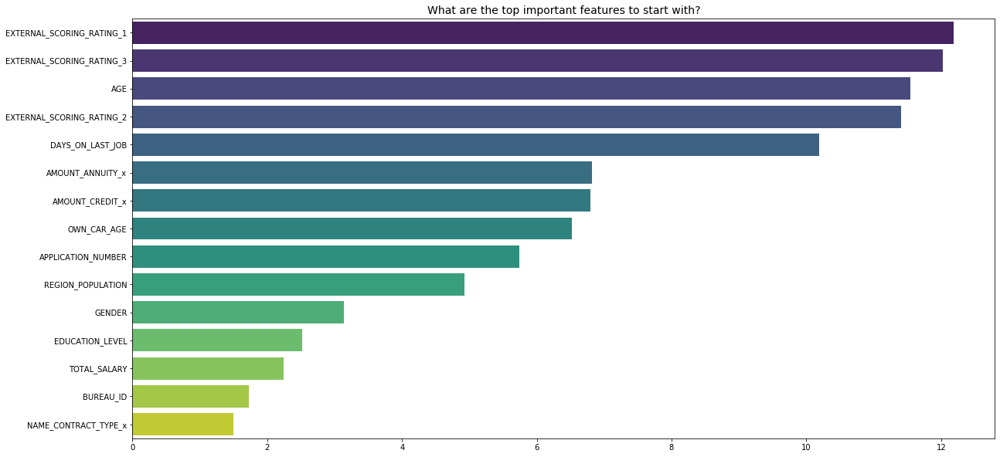

In [65]:
n_top = 15
importances = ctb.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = my_train.drop(['TARGET'], axis=1).columns

plt.figure(figsize=(20, 10))
sns.barplot(x=importances[idx], y=feature_names[idx], palette="viridis", orient='h')
plt.title("What are the top important features to start with?", size=14)

Text(0.5, 1.0, 'What are the top important features to start with?')

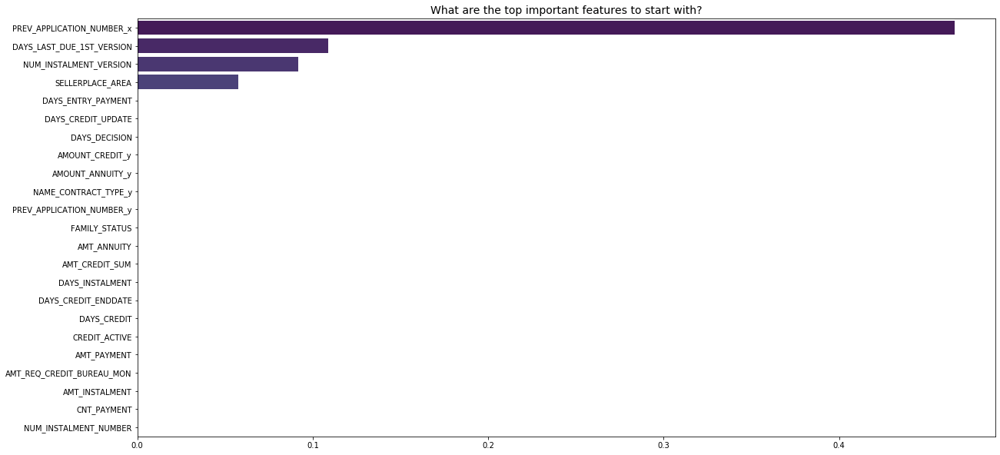

In [62]:
n_top = 15
importances = ctb.feature_importances_
idx2 = np.argsort(importances)[::-1][n_top:]
feature_names2 = my_train.drop(['TARGET'], axis=1).columns

plt.figure(figsize=(20, 10))
sns.barplot(x=importances[idx2], y=feature_names2[idx2], palette="viridis", orient='h')
plt.title("What are the top important features to start with?", size=14)

In [68]:
# feature_names[idx]
profit_columns = [
 'EXTERNAL_SCORING_RATING_1',
 'EXTERNAL_SCORING_RATING_3',
 'AGE',
 'EXTERNAL_SCORING_RATING_2',
 'DAYS_ON_LAST_JOB',
 'AMOUNT_ANNUITY_x',
 'AMOUNT_CREDIT_x',
 'OWN_CAR_AGE',
 'APPLICATION_NUMBER',
 'REGION_POPULATION',
 'GENDER',
 'EDUCATION_LEVEL',
 'TOTAL_SALARY',
 'BUREAU_ID',
 'NAME_CONTRACT_TYPE_x'
]

In [64]:
# feature_names[idx2]
drop_columns = [
 'PREV_APPLICATION_NUMBER_x'
 'DAYS_LAST_DUE_1ST_VERSION',
 'NUM_INSTALMENT_VERSION',
 'SELLERPLACE_AREA',
 'DAYS_ENTRY_PAYMENT',
 'DAYS_CREDIT_UPDATE',
 'DAYS_DECISION',
 'AMOUNT_CREDIT_y',
 'AMOUNT_ANNUITY_y',
 'NAME_CONTRACT_TYPE_y',
 'PREV_APPLICATION_NUMBER_y',
 'FAMILY_STATUS',
 'AMT_ANNUITY',
 'AMT_CREDIT_SUM',
 'DAYS_INSTALMENT',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_CREDIT',
 'CREDIT_ACTIVE',
 'AMT_PAYMENT',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_INSTALMENT',
 'CNT_PAYMENT',
 'NUM_INSTALMENT_NUMBER'
]

In [69]:
cp_columns = [
 'APPLICATION_NUMBER',
 'GENDER',
#  'CHILDRENS',
 'TOTAL_SALARY',
 'AMOUNT_CREDIT',
 'AMOUNT_ANNUITY',
 'EDUCATION_LEVEL',
#  'FAMILY_STATUS',
 'REGION_POPULATION',
 'AGE',
 'DAYS_ON_LAST_JOB',
 'OWN_CAR_AGE',
#  'FLAG_PHONE',
#  'FLAG_EMAIL',
#  'FAMILY_SIZE',
 'EXTERNAL_SCORING_RATING_1',
 'EXTERNAL_SCORING_RATING_2',
 'EXTERNAL_SCORING_RATING_3',
#  'AMT_REQ_CREDIT_BUREAU_HOUR',
#  'AMT_REQ_CREDIT_BUREAU_DAY',
#  'AMT_REQ_CREDIT_BUREAU_WEEK',
#  'AMT_REQ_CREDIT_BUREAU_MON',
#  'AMT_REQ_CREDIT_BUREAU_QRT',
#  'AMT_REQ_CREDIT_BUREAU_YEAR'
]

payments_columns = [
#  'PREV_APPLICATION_NUMBER',
 'APPLICATION_NUMBER',
#  'NUM_INSTALMENT_VERSION',
#  'NUM_INSTALMENT_NUMBER',
#  'DAYS_INSTALMENT',
#  'DAYS_ENTRY_PAYMENT',
#  'AMT_INSTALMENT',
#  'AMT_PAYMENT'
]

bki_columns = [
 'APPLICATION_NUMBER',
 'BUREAU_ID',
#  'CREDIT_ACTIVE',
#  'CREDIT_CURRENCY',
#  'DAYS_CREDIT',
#  'CREDIT_DAY_OVERDUE',
#  'DAYS_CREDIT_ENDDATE',
#  'DAYS_ENDDATE_FACT',
#  'AMT_CREDIT_MAX_OVERDUE',
#  'CNT_CREDIT_PROLONG',
#  'AMT_CREDIT_SUM',
#  'AMT_CREDIT_SUM_DEBT',
#  'AMT_CREDIT_SUM_LIMIT',
#  'AMT_CREDIT_SUM_OVERDUE',
#  'CREDIT_TYPE',
#  'DAYS_CREDIT_UPDATE',
#  'AMT_ANNUITY'
]

app_history_columns = [
#  'PREV_APPLICATION_NUMBER',
 'APPLICATION_NUMBER',
 'NAME_CONTRACT_TYPE',
#  'AMOUNT_ANNUITY',
#  'AMT_APPLICATION',
#  'AMOUNT_CREDIT',
#  'AMOUNT_PAYMENT',
#  'AMOUNT_GOODS_PAYMENT',
#  'NAME_CONTRACT_STATUS',
#  'DAYS_DECISION',
#  'NAME_PAYMENT_TYPE',
#  'CODE_REJECT_REASON',
#  'NAME_TYPE_SUITE',
#  'NAME_CLIENT_TYPE',
#  'NAME_GOODS_CATEGORY',
#  'NAME_PORTFOLIO',
#  'NAME_PRODUCT_TYPE',
#  'SELLERPLACE_AREA',
#  'CNT_PAYMENT',
#  'NAME_YIELD_GROUP',
#  'DAYS_FIRST_DRAWING',
#  'DAYS_FIRST_DUE',
#  'DAYS_LAST_DUE_1ST_VERSION',
#  'DAYS_LAST_DUE',
#  'DAYS_TERMINATION',
#  'NFLAG_INSURED_ON_APPROVAL'
]

In [70]:
my_train = pd.merge(train, client_profile[cp_columns], on='APPLICATION_NUMBER', how='left')

In [71]:
my_train = pd.merge(my_train, payments[payments_columns], on='APPLICATION_NUMBER', how='left')

In [72]:
my_train = pd.merge(my_train, bki[bki_columns], on='APPLICATION_NUMBER', how='left')

In [73]:
my_train = pd.merge(my_train, applications_history[app_history_columns], on='APPLICATION_NUMBER', how='left')

In [74]:
my_train

,APPLICATION_NUMBER,TARGET,NAME_CONTRACT_TYPE_x,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,BUREAU_ID,NAME_CONTRACT_TYPE_y
0,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,0.019101,15728.0,1719.0,11.0,0.700784,0.645914,0.716570,5640206.0,NaN
1,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,0.019101,15728.0,1719.0,11.0,0.700784,0.645914,0.716570,5640206.0,NaN
2,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,0.019101,15728.0,1719.0,11.0,0.700784,0.645914,0.716570,5640206.0,NaN
3,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,0.019101,15728.0,1719.0,11.0,0.700784,0.645914,0.716570,5640206.0,NaN
4,123687442,0,Cash,M,157500.0,855000.0,25128.0,Secondary / secondary special,0.019101,15728.0,1719.0,11.0,0.700784,0.645914,0.716570,5640206.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059221,123554358,0,Cash,F,270000.0,1024740.0,49428.0,Incomplete higher,0.019101,15008.0,361.0,22.0,0.653826,0.651227,0.558507,6750483.0,Cash
8059222,123676265,0,Credit Card,F,112500.0,337500.0,16875.0,Secondary / secondary special,0.031329,15781.0,258.0,NaN,NaN,0.552043,NaN,6423033.0,NaN
8059223,123676265,0,Credit Card,F,112500.0,337500.0,16875.0,Secondary / secondary special,0.031329,15781.0,258.0,NaN,NaN,0.552043,NaN,6389921.0,NaN
8059224,123676265,0,Credit Card,F,112500.0,337500.0,16875.0,Secondary / secondary special,0.031329,15781.0,258.0,NaN,NaN,0.552043,NaN,6423033.0,NaN


In [75]:
for ii in my_train.select_dtypes(include=['object', 'category']).columns.tolist():
    my_train[ii] = my_train[ii].astype(str)

In [76]:
# parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}
cat_features_idx5 = np.where(my_train.drop(['TARGET'], axis=1).dtypes == 'object')[0].tolist()

ctb5 = CatBoostClassifier(**params)
ctb5.fit(my_train.drop(['TARGET'], axis=1).fillna(-9999), my_train['TARGET'], cat_features=cat_features_idx5, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Text(0.5, 1.0, 'What are the top important features to start with?')

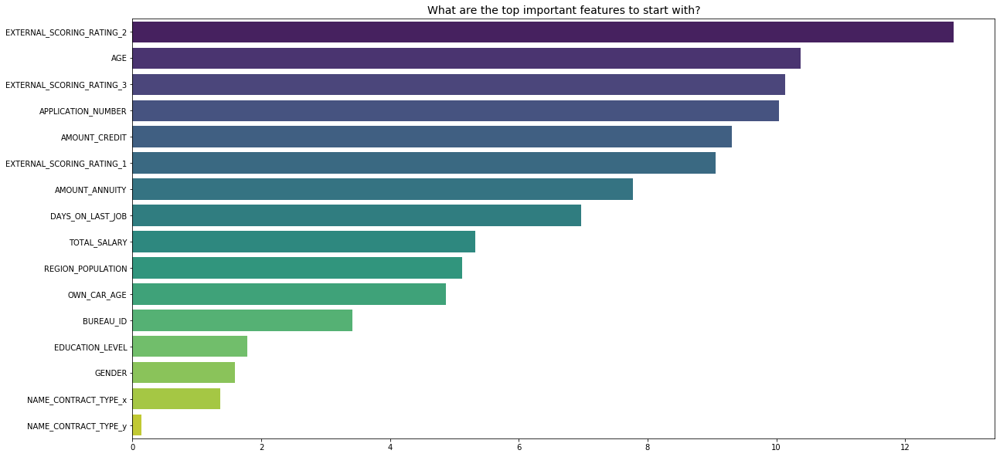

In [77]:
n_top = 35
importances = ctb5.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = my_train.drop(['TARGET'], axis=1).columns

plt.figure(figsize=(20, 10))
sns.barplot(x=importances[idx], y=feature_names[idx], palette="viridis", orient='h')
plt.title("What are the top important features to start with?", size=14)

In [ ]:
# на тесте

In [78]:
my_test = pd.merge(test, client_profile[cp_columns], on='APPLICATION_NUMBER', how='left')

In [79]:
my_test = pd.merge(my_test, payments[payments_columns], on='APPLICATION_NUMBER', how='left')

In [80]:
my_test = pd.merge(my_test, bki[bki_columns], on='APPLICATION_NUMBER', how='left')

In [81]:
my_test = pd.merge(my_test, applications_history[app_history_columns], on='APPLICATION_NUMBER', how='left')

In [82]:
my_test

,APPLICATION_NUMBER,NAME_CONTRACT_TYPE_x,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,BUREAU_ID,NAME_CONTRACT_TYPE_y
0,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card
1,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card
2,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,NaN
3,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card
4,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12108271,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6657532.0,NaN
12108272,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6680154.0,NaN
12108273,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6680154.0,NaN
12108274,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6633686.0,NaN


In [83]:
for ii in my_test.select_dtypes(include=['object', 'category']).columns.tolist():
    my_test[ii] = my_test[ii].astype(str)

In [84]:
pred_test = ctb5.predict_proba(my_test)

In [85]:
pred_test[:,1]

array([0.06534245, 0.06534245, 0.06534245, ..., 0.11279655, 0.1027575 ,
       0.1027575 ])

In [86]:
len(pred_test[:,1])

12108276

In [87]:
my_test['pred_test'] = pred_test[:,1].tolist()

In [88]:
my_test

,APPLICATION_NUMBER,NAME_CONTRACT_TYPE_x,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,BUREAU_ID,NAME_CONTRACT_TYPE_y,pred_test
0,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card,0.065342
1,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card,0.065342
2,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,nan,0.065342
3,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card,0.065342
4,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card,0.065342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12108271,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6657532.0,nan,0.112797
12108272,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6680154.0,nan,0.112797
12108273,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6680154.0,nan,0.112797
12108274,123433260,Cash,M,247500.0,1241437.5,36427.5,Secondary / secondary special,0.018029,18853.0,6543.0,15.0,NaN,0.493617,0.546023,6633686.0,nan,0.102757


In [89]:
drop_in_index_test = my_test.loc[my_test['APPLICATION_NUMBER'].duplicated()].index
my_test = my_test.drop(index=drop_in_index_test, axis=0)
my_test

,APPLICATION_NUMBER,NAME_CONTRACT_TYPE_x,GENDER,TOTAL_SALARY,AMOUNT_CREDIT,AMOUNT_ANNUITY,EDUCATION_LEVEL,REGION_POPULATION,AGE,DAYS_ON_LAST_JOB,OWN_CAR_AGE,EXTERNAL_SCORING_RATING_1,EXTERNAL_SCORING_RATING_2,EXTERNAL_SCORING_RATING_3,BUREAU_ID,NAME_CONTRACT_TYPE_y,pred_test
0,123724268,Cash,M,117000.0,1125000.0,32895.0,Secondary / secondary special,0.028663,16007.0,2646.0,20.0,NaN,0.628266,NaN,6181931.0,Credit Card,0.065342
8,123456549,Cash,F,81000.0,312768.0,17095.5,Secondary / secondary special,0.019689,10315.0,459.0,NaN,NaN,0.578161,0.188490,5470136.0,Cash,0.466772
16,123428178,Credit Card,F,157500.0,450000.0,22500.0,Secondary / secondary special,0.019101,13016.0,977.0,NaN,NaN,0.152544,0.382502,6692890.0,Cash,0.134943
64,123619984,Cash,nan,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5350996.0,nan,0.099482
66,123671104,Cash,F,90000.0,254700.0,24939.0,Higher education,0.015221,17743.0,9258.0,NaN,0.718604,0.505704,0.415347,5546222.0,nan,0.026483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12107696,123487967,Cash,nan,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Credit Card,0.072957
12107702,123536402,Cash,M,135000.0,450000.0,16807.5,Secondary / secondary special,0.028663,18610.0,10398.0,23.0,NaN,0.665971,0.535276,NaN,nan,0.039474
12107706,123718238,Cash,nan,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5370810.0,Cash,0.060717
12108106,123631557,Cash,F,112500.0,350181.0,36769.5,Secondary / secondary special,0.030755,20551.0,365243.0,NaN,NaN,0.761376,NaN,5911753.0,Cash,0.010537


In [ ]:
# my_test['pred_test'] = my_test['pred_test'].astype('int')

In [90]:
sample_submit = pd.read_csv(r"./competitive-data-analysis_coursework/sample_submit.csv")

In [33]:
my_test['pred_test']

0           0.079992
8           0.264392
16          0.192598
64          0.093135
66          0.015958
              ...   
12107696    0.091299
12107702    0.031425
12107706    0.075516
12108106    0.019336
12108246    0.055036
Name: pred_test, Length: 165141, dtype: float64

In [91]:
sample_submit['TARGET'] = my_test['pred_test'].tolist()

In [92]:
sample_submit.to_csv(r"./competitive-data-analysis_coursework/submitions/sport_kag_lite25.csv", index=False)
# !kaggle competitions submit -c geekbrains-competitive-data-analysis -f $sport_kag_lite1 -m "lite1"
sample_submit

,APPLICATION_NUMBER,TARGET
0,123724268,0.065342
1,123456549,0.466772
2,123428178,0.134943
3,123619984,0.099482
4,123671104,0.026483
...,...,...
165136,123487967,0.072957
165137,123536402,0.039474
165138,123718238,0.060717
165139,123631557,0.010537


In [ ]:
# на лидерборде 0.68
# parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}

In [ ]:
# на лидерборде 0.69788
# params = {'silent': True, 'learning_rate': 0.1, 'depth': 3, 'random_state': 99}


### 7. Вывод <a class='anchor' id='end'>

Объединение датасетов(left join) train и client_profile дало наибольший пророст качества, а объединение остальных датасетов с train практически никак не повысило качество и осталось на уровне случайного гадания, более того, объединение (train и client_profile) с остальными датасетами(в результате 8кк наблюдений на train и 12кк наблюдений  на test) снижает качество прогноза на лидерборде kaggle. 

В более детальном исследовании признаков с помощью Shap(заменяющим штатный feature_importance) и других продвинутых методов на данном этапе нет необходимости.   

Для дальнейшей работы следует взять объединение датасетов(left join) train и client_profile с некоторыми признаками. 
